In [2]:
%%time
dataset_name = "W20_only"
df_list = "BES_Panel"

%matplotlib inline
%run BES_header.py {dataset_name} {df_list}

Toggle code

Wall time: 34.9 s


In [3]:
df = pd.read_stata( "E:\\Users\\Gamer\\Documents\\GitHub\\BES_analysis\\BES_analysis_data\\W23_comb\\BES2019_W23_Panel_v23.0.dta" )
labelsW23 = pd.io.stata.StataReader("E:\\Users\\Gamer\\Documents\\GitHub\\BES_analysis\\BES_analysis_data\\W23_comb\\BES2019_W23_Panel_v23.0.dta").variable_labels()

In [28]:
search(df,"housing")

housingW1       26753
p_housingW1     30282
p_housingW2     30221
p_housingW3     28105
p_housingW4     16757
p_housingW5     30760
p_housingW6     30087
p_housingW7     30199
p_housingW8     33348
p_housingW9     29945
p_housingW10    30226
p_housingW11    30255
p_housingW12    27382
p_housingW13    30749
p_housingW14    30448
p_housingW15    29967
p_housingW16    36171
p_housingW17    33617
p_housingW18    37530
p_housingW19    32009
p_housingW20    31031
p_housingW21    30032
p_housingW22    28056
p_housingW23    30803
dtype: int64

In [33]:
{k:v for k,v in labelsW23.items() if "council" in v}

{'accessCouncilWorkerW3': 'Social capital: Works for your local council',
 'accessCouncillorW3': 'Social capital: Is a local councillor',
 'approveLAW7': 'Approve: your local council',
 'resourceAccess2_1W7': 'Access to: works for your local council',
 'resourceAccess2_2W7': 'Access to: local councillor',
 'councilHouseW12': 'The government should fund the building of new council housing',
 'resourceAccess2_1W20': 'Access to: works for your local council',
 'resourceAccess2_2W20': 'Access to: local councillor',
 'approveLAW21': 'Approve: your local council'}

In [276]:
gender = pd.read_stata( "E:\\Users\\Gamer\\Documents\\GitHub\\BES_analysis\\BES_analysis_data\\W23_comb\\BES2019_W23_Panel_v23.0.dta",columns=['gender'] )

In [274]:
gc.collect()

20

In [3]:
search(df,"gender|alscale")

genderRolesW10     30237
impGenderW14        7801
gender            106229
dtype: int64

In [4]:
search(df,"nuclear|nuke")

nuclearGridW4     7927
keepNukesW4       7927
nuclearGridW7    30895
keepNukesW7      30895
keepNukesW12     34394
keepNukesW23     30949
dtype: int64

In [39]:
search(df,"gender|al_scale|al\dW23|gayEquality")

genderRolesW10        30237
impGenderW14           7801
gayEqualityW15         5109
gayEqualityW16        37959
gayEqualityW17        34366
al1W23                30949
al2W23                30949
al3W23                30949
al4W23                30949
al5W23                30949
gayEqualityW23        30949
gayEqualityW1_W5      41876
gayEqualityW6_W14     63222
al_scaleW1_W5         37890
al_scaleW6            27288
al_scaleW7_W9         35873
al_scaleW10_W12       30088
al_scaleW13           27252
al_scaleW14W15        31629
al_scaleW16           32671
al_scaleW17_W19       29773
al_scaleW20           26914
al_scaleW21           25692
al_scaleW22           23617
al_scaleW23           26399
gender               106229
dtype: int64

In [30]:
df["al_scaleW23"].groupby(df["gender"]).apply(lambda x: x.cat.codes.replace(-1,np.nan).mean()/20)

gender
Male      0.609325
Female    0.619419
Name: al_scaleW23, dtype: float64

In [10]:
df["al_scaleW23"]

0         NaN
1         4.0
2         6.5
3         NaN
4         NaN
         ... 
107791    NaN
107792    NaN
107793    NaN
107794    NaN
107795    NaN
Name: al_scaleW23, Length: 107796, dtype: category
Categories (21, object): ['Libertarian' < 0.5 < 1.0 < 1.5 ... 8.5 < 9.0 < 9.5 < 'Authoritarian']

In [34]:
df[["al1W23","al2W23","al3W23","al5W23"]].apply(lambda x: x.cat.codes.replace(-1,np.nan)/5).mean(axis=1).groupby(df["gender"]).mean()

gender
Male      0.532445
Female    0.529771
dtype: float64

In [37]:
authoritarianism = df["al_scaleW23"].cat.codes.replace(-1,np.nan)/20

In [55]:
gayEquality = df["gayEqualityW23"].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)
blackEquality = df["blackEqualityW23"].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)
femaleEquality = df["femaleEqualityW23"].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)

In [179]:
het_or_not = df["p_sexualityW23"]=="Heterosexual"
het_or_not[df["p_sexualityW23"].isnull()]=np.nan
het_or_not = het_or_not.replace({1.0:"Heterosexual",0:"Not Heterosexual"})
het_or_not.value_counts(dropna=False)

NaN                 76903
Heterosexual        27207
Not Heterosexual     3686
Name: p_sexualityW23, dtype: int64

In [183]:
whiteBrit_or_not = df["p_ethnicityW23"]=="White British"
whiteBrit_or_not[df["p_ethnicityW23"].isnull()]=np.nan
whiteBrit_or_not = whiteBrit_or_not.replace({1.0:"White British",0.0:"Not White British"})
whiteBrit_or_not.value_counts(dropna=False)

NaN                  78397
White British        26243
Not White British     3156
Name: p_ethnicityW23, dtype: int64

In [186]:
authoritarianism.name = 'authoritarianism'
gayEquality.name = 'gayEquality'
blackEquality.name = 'blackEquality'
femaleEquality.name = 'femaleEquality'
het_or_not.name = 'het_or_not'
whiteBrit_or_not.name = 'whiteBrit_or_not'

In [139]:
g.axes[0,0].set_xlabel('axes label 1')
g.axes[0,1].set_xlabel('axes label 2')

authoritarianism     float64
gender              category
variable              object
value                float64
dtype: object

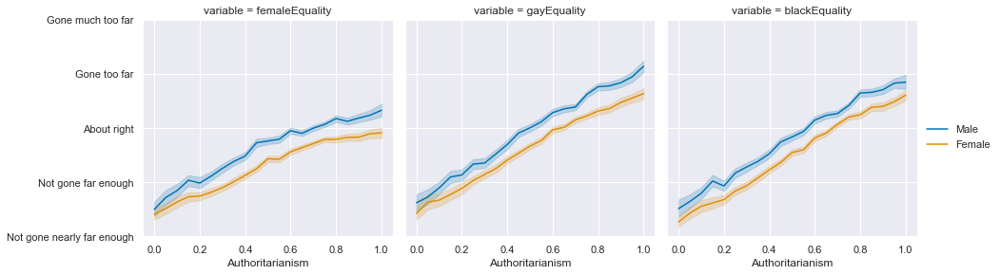

In [184]:
data =pd.concat([authoritarianism,femaleEquality,gayEquality,blackEquality,df["gender"]],axis=1)
data = data.melt(id_vars=["authoritarianism","gender"])

g = sns.FacetGrid(data=data, col="variable",height=4)
g.map_dataframe(sns.lineplot,x="authoritarianism",y="value",hue="gender");
plt.ylim([0,4]);
g.add_legend();
g.axes[0,0].set_xlabel('Authoritarianism');
g.axes[0,1].set_xlabel('Authoritarianism');
g.axes[0,2].set_xlabel('Authoritarianism');
g.set(yticks=[0,1,2,3,4])
g.set_yticklabels(['Not gone nearly far enough','Not gone far enough',
                       'About right','Gone too far',
                       'Gone much too far']);

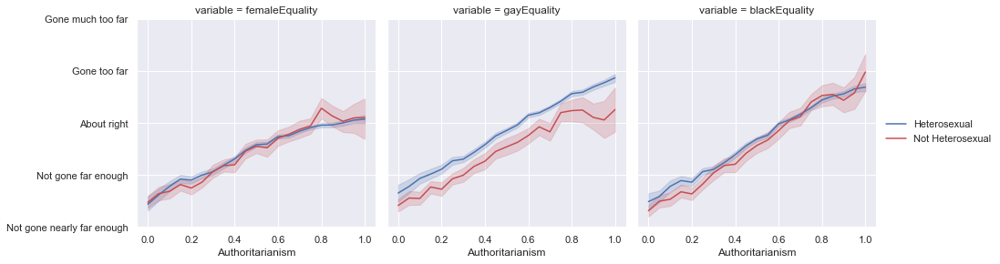

In [188]:
data =pd.concat([authoritarianism,femaleEquality,gayEquality,blackEquality,het_or_not],axis=1)
data = data.melt(id_vars=["authoritarianism","het_or_not"])

g = sns.FacetGrid(data=data, col="variable",height=4)
g.map_dataframe(sns.lineplot,x="authoritarianism",y="value",hue="het_or_not",palette={'Not Heterosexual':'r','Heterosexual':'b'});
plt.ylim([0,4]);
g.add_legend();
g.axes[0,0].set_xlabel('Authoritarianism');
g.axes[0,1].set_xlabel('Authoritarianism');
g.axes[0,2].set_xlabel('Authoritarianism');
g.set(yticks=[0,1,2,3,4])
g.set_yticklabels(['Not gone nearly far enough','Not gone far enough',
                       'About right','Gone too far',
                       'Gone much too far']);

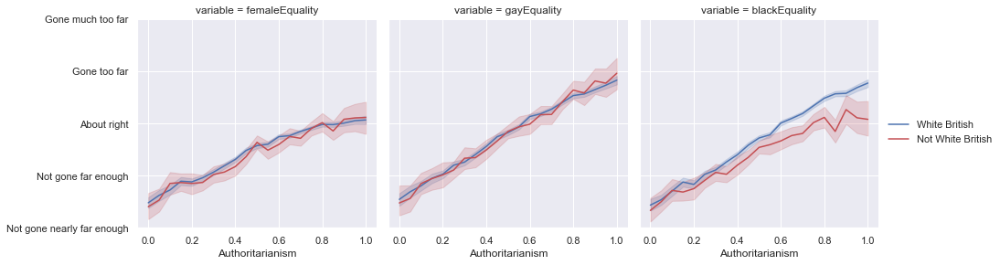

In [190]:
data =pd.concat([authoritarianism,femaleEquality,gayEquality,blackEquality,whiteBrit_or_not],axis=1)
data = data.melt(id_vars=["authoritarianism","whiteBrit_or_not"])

g = sns.FacetGrid(data=data, col="variable",height=4)
g.map_dataframe(sns.lineplot,x="authoritarianism",y="value",hue="whiteBrit_or_not",palette={'Not White British':'r','White British':'b'});
plt.ylim([0,4]);
g.add_legend();
g.axes[0,0].set_xlabel('Authoritarianism');
g.axes[0,1].set_xlabel('Authoritarianism');
g.axes[0,2].set_xlabel('Authoritarianism');
g.set(yticks=[0,1,2,3,4])
g.set_yticklabels(['Not gone nearly far enough','Not gone far enough',
                       'About right','Gone too far',
                       'Gone much too far']);

In [ ]:
# what if we mask these last two on gender as well?

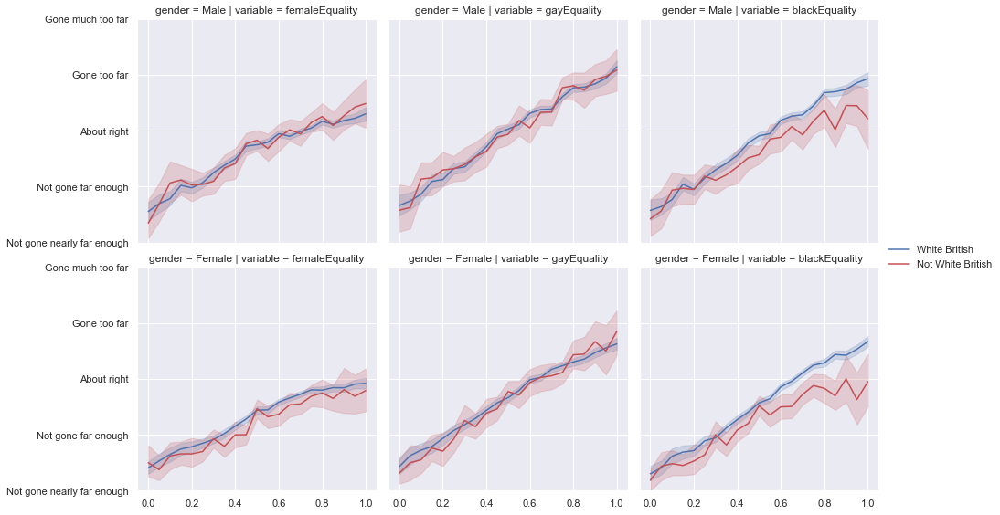

In [191]:
data =pd.concat([authoritarianism,femaleEquality,gayEquality,blackEquality,whiteBrit_or_not,df["gender"]],axis=1)
data = data.melt(id_vars=["authoritarianism","whiteBrit_or_not","gender"])

g = sns.FacetGrid(data=data, col="variable",row="gender",height=4)
g.map_dataframe(sns.lineplot,x="authoritarianism",y="value",hue="whiteBrit_or_not",palette={'Not White British':'r','White British':'b'});
plt.ylim([0,4]);
g.add_legend();
g.axes[0,0].set_xlabel('Authoritarianism');
g.axes[0,1].set_xlabel('Authoritarianism');
g.axes[0,2].set_xlabel('Authoritarianism');
g.set(yticks=[0,1,2,3,4])
g.set_yticklabels(['Not gone nearly far enough','Not gone far enough',
                       'About right','Gone too far',
                       'Gone much too far']);

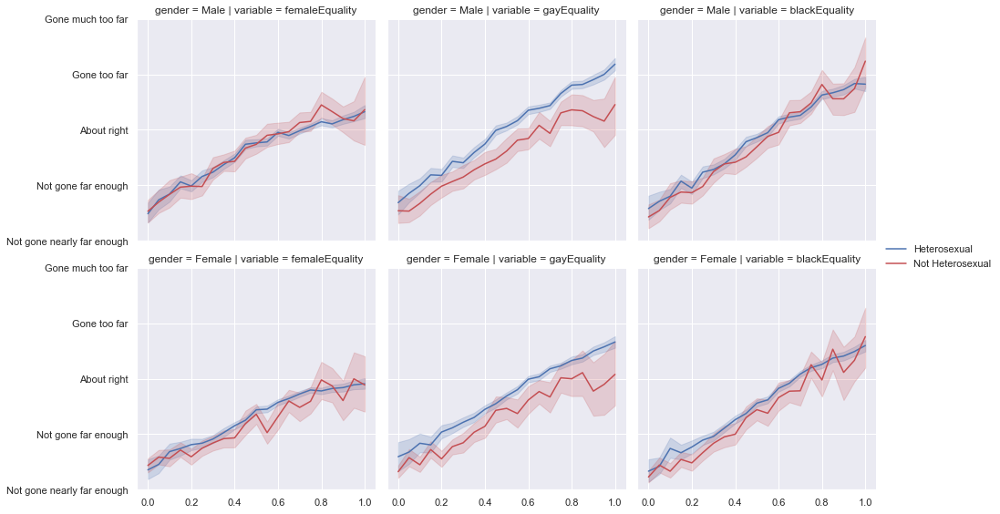

In [192]:
data =pd.concat([authoritarianism,femaleEquality,gayEquality,blackEquality,het_or_not,df["gender"]],axis=1)
data = data.melt(id_vars=["authoritarianism","het_or_not","gender"])

g = sns.FacetGrid(data=data, col="variable",row='gender',height=4)
g.map_dataframe(sns.lineplot,x="authoritarianism",y="value",hue="het_or_not",palette={'Not Heterosexual':'r','Heterosexual':'b'});
plt.ylim([0,4]);
g.add_legend();
g.axes[0,0].set_xlabel('Authoritarianism');
g.axes[0,1].set_xlabel('Authoritarianism');
g.axes[0,2].set_xlabel('Authoritarianism');
g.set(yticks=[0,1,2,3,4])
g.set_yticklabels(['Not gone nearly far enough','Not gone far enough',
                       'About right','Gone too far',
                       'Gone much too far']);

In [216]:
authoritarianism_minus_cen = df[["al1W23","al2W23","al3W23","al5W23",]].apply(lambda x: x.cat.codes.replace(-1,np.nan)/5).mean(axis=1).round(2)
authoritarianism_minus_cen.name = 'authoritarianism_minus_cen'

In [204]:
authoritarianism.notnull().sum(),authoritarianism_minus_cen.notnull().sum(),

(26399, 30949)

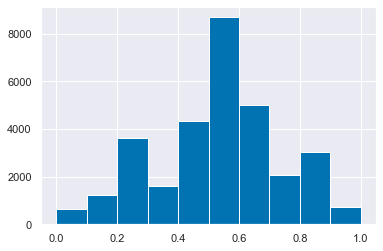

In [217]:
authoritarianism_minus_cen.hist(bins=10)

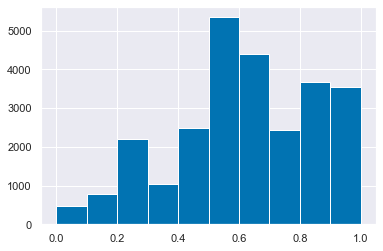

In [218]:
authoritarianism.hist(bins=10)

In [221]:
authoritarianism.value_counts()

0.75    2434
0.70    2285
0.65    2123
0.80    1920
0.60    1878
0.50    1781
0.85    1745
0.55    1689
0.90    1458
0.45    1326
0.40    1163
0.95    1128
0.35    1029
1.00     971
0.30     908
0.25     719
0.20     586
0.15     447
0.10     343
0.00     237
0.05     229
Name: authoritarianism, dtype: int64

In [219]:
authoritarianism_minus_cen.value_counts()

0.60    3417
0.80    2832
0.55    2711
0.70    2585
0.50    2557
0.65    2431
0.40    2236
0.45    2109
0.75    2073
0.35    1588
0.30    1460
0.25    1190
0.20     973
0.15     732
1.00     616
0.10     493
0.05     319
0.00     304
0.85     200
0.90      94
0.95      29
Name: authoritarianism_minus_cen, dtype: int64

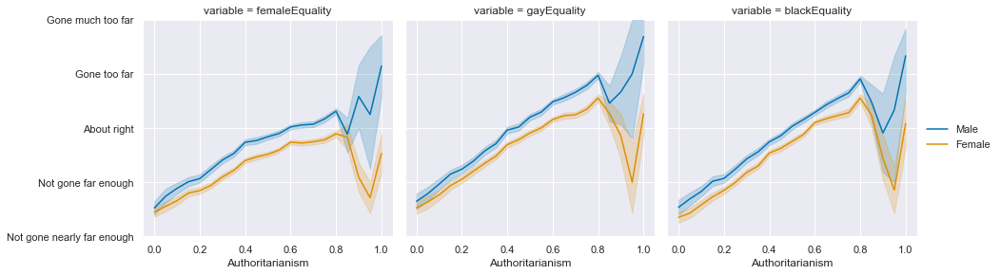

In [220]:
data =pd.concat([authoritarianism_minus_cen,femaleEquality,gayEquality,blackEquality,df["gender"]],axis=1)
data = data.melt(id_vars=["authoritarianism_minus_cen","gender"])

g = sns.FacetGrid(data=data, col="variable",height=4)
g.map_dataframe(sns.lineplot,x="authoritarianism_minus_cen",y="value",hue="gender");
plt.ylim([0,4]);
g.add_legend();
g.axes[0,0].set_xlabel('Authoritarianism');
g.axes[0,1].set_xlabel('Authoritarianism');
g.axes[0,2].set_xlabel('Authoritarianism');
g.set(yticks=[0,1,2,3,4])
g.set_yticklabels(['Not gone nearly far enough','Not gone far enough',
                       'About right','Gone too far',
                       'Gone much too far']);

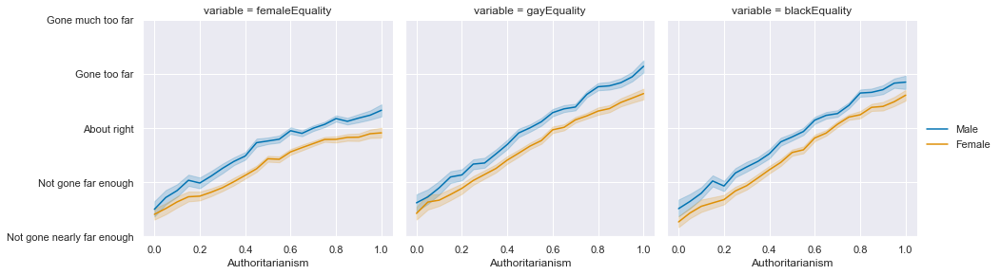

In [222]:
data =pd.concat([authoritarianism,femaleEquality,gayEquality,blackEquality,df["gender"]],axis=1)
data = data.melt(id_vars=["authoritarianism","gender"])

g = sns.FacetGrid(data=data, col="variable",height=4)
g.map_dataframe(sns.lineplot,x="authoritarianism",y="value",hue="gender");
plt.ylim([0,4]);
g.add_legend();
g.axes[0,0].set_xlabel('Authoritarianism');
g.axes[0,1].set_xlabel('Authoritarianism');
g.axes[0,2].set_xlabel('Authoritarianism');
g.set(yticks=[0,1,2,3,4])
g.set_yticklabels(['Not gone nearly far enough','Not gone far enough',
                       'About right','Gone too far',
                       'Gone much too far']);

In [ ]:
## where to go from here
# Beg Rosalind Shorrocks for halp!

# try to find gender gaps on other variables that correlate with authoritarianism???

In [223]:
df

,id,waves_taken,wave1,wave2,wave3,wave4,wave5,wave6,wave7,wave8,...,p_edlevelUniW19,p_edlevelUniW20,p_edlevelUniW21,p_edlevelUniW8,p_edlevelUniW17,p_edlevelUniW18,p_eurefturnout,cogempathyIRTW14,affempathyIRTW14,zeroSumIRTW14
0,1.0,9.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,...,NaN,NaN,NaN,Undergraduate,NaN,NaN,"Yes, voted",NaN,NaN,NaN
1,2.0,20.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,...,Undergraduate,Undergraduate,Undergraduate,Undergraduate,Undergraduate,Undergraduate,"Yes, voted",NaN,NaN,NaN
2,3.0,16.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,...,A-level,NaN,NaN,NaN,NaN,NaN,"Yes, voted",NaN,NaN,NaN
3,4.0,2.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5.0,2.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
107791,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
107792,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
107793,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
107794,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [35]:
%%time
dataset_name = "W19_comb"
df_list = "BES_Panel|BES_reduced_with_na"

%matplotlib inline
%run BES_header.py {dataset_name} {df_list}

Toggle code

Wall time: 18.5 s


In [3]:
# %%time
# dataset_name = "W19_only"
# df_list = "BES_Panel|BES_reduced_with_na"

# %matplotlib inline
# %run BES_header.py {dataset_name} {df_list}

In [4]:
(var_type, cat_dictionary, new_old_col_names, old_new_col_names) = get_small_files(data_subfolder, encoding)

var_type (8079, 14)


In [5]:
# authoritarianism.corr(gayEquality)

In [6]:
BES_reduced_with_na.astype('float')[BES_reduced_with_na["gender_Female"]].mean()-BES_reduced_with_na.astype('float')[~BES_reduced_with_na["gender_Female"]].mean()

turnoutUKGeneral__Very likely that I will vote   -0.092214
partyIdStrength__Not very strong                  0.071216
polAttention__Pay a great deal of attention      -0.843130
pidWeThey__Strongly agree                        -0.158527
pidInterestedOthers__Strongly agree              -0.006465
                                                    ...   
responsibleEconC_2_Yes                           -0.004656
responsibleEconC_1_Yes                           -0.065377
coronaMeasures_2_Yes                              0.044327
coronaMeasures_1_Yes                             -0.002246
coronaMeasures_4_Yes                              0.018628
Length: 742, dtype: float64

In [10]:
#gayEquality[gender]
# gayEquality.groupby(gender["gender"]).mean()
# gap = -.33

In [32]:
search(BES_reduced_with_na,"gay")

p_sexuality_Gay or lesbian    29733
dtype: int64

In [8]:
search(BES_reduced_with_na,"al_scale")

al_scale__Authoritarian    26914
dtype: int64

In [9]:
search(BES_reduced_with_na,"gender")

gender_Female    31468
dtype: int64

In [11]:
corrs = BES_reduced_with_na.astype('float').corrwith(BES_reduced_with_na["al_scale__Authoritarian"])

In [12]:
corrs.sort_values().head(10)

asylumMore__Many more                   -0.642608
immigSelf__Allow many more              -0.595072
immigCultural__Enriches cultural life   -0.550090
immigEcon__Good for economy             -0.525165
familiesMore__Many more                 -0.509567
globalMigration__Mainly good            -0.486567
euMore__Many more                       -0.464038
noneuMore__Many more                    -0.444615
studentsMore__Many more                 -0.440946
ptvGrn__Very likely                     -0.430384
dtype: float64

In [13]:
corrs.sort_values().tail(10)

dealPriorityRedTape__Extremely important    0.582385
al4__Strongly agree                         0.628310
immigrantsWelfareState__Strongly agree      0.634510
govtHandouts__Strongly agree                0.635757
dealPriorityImmig__Extremely important      0.640230
al3__Strongly agree                         0.783903
al2__Strongly agree                         0.790263
al5__Strongly agree                         0.800879
al1__Strongly agree                         0.819360
al_scale__Authoritarian                     1.000000
dtype: float64

In [18]:
gender_gap = BES_reduced_with_na.astype('float')[BES_reduced_with_na["gender_Female"]].mean()-BES_reduced_with_na.astype('float')[~BES_reduced_with_na["gender_Female"]].mean()
gender_gap = gender_gap/BES_reduced_with_na.astype('float').max()

In [19]:
gender_gap.sort_values().head(10)

selfOccSuperviseLast_Yes                                                                                                                 -0.181702
p_job_sector_Private sector profit-seeking (e.g. public limited company, partnership)                                                    -0.179007
sectorPartner_Other public sector employer *Incl eg: - Central govt/ Civil Service/ Govt Agency - Local authority/ Local Educ Auth/sch   -0.149172
sector_Private sector firm of company Including, for example, limited companies and PLCs                                                 -0.147856
p_work_stat_Working full time (30 or more hours per week)                                                                                -0.128895
workingStatus_Working full time (30 or more hours per week)                                                                              -0.123512
selfPriorities_brexit_Yes                                                                                             

In [23]:
high_correlation_corrs = [x for x in list( corrs[corrs.abs()>.25].index ) if x not in ["al_scale__Authoritarian",
                                                                                      "al1__Strongly agree",
                                                                                      "al2__Strongly agree",
                                                                                      "al3__Strongly agree",
                                                                                      "al4__Strongly agree",
                                                                                      "al5__Strongly agree"] ]

In [20]:
gender_gap.loc[ corrs.sort_values().head(10).index ]

asylumMore__Many more                    0.051097
immigSelf__Allow many more               0.013284
immigCultural__Enriches cultural life    0.064141
immigEcon__Good for economy              0.010820
familiesMore__Many more                  0.040651
globalMigration__Mainly good             0.026627
euMore__Many more                        0.033188
noneuMore__Many more                     0.038408
studentsMore__Many more                  0.008390
ptvGrn__Very likely                      0.058955
dtype: float64

In [24]:
gender_gap.loc[high_correlation_corrs].abs().mean()

0.028762200800453698

In [25]:
gender_gap.abs().mean()

0.026679764331555847

In [26]:
gender_gap.loc[high_correlation_corrs]

likeJohnson__Strongly like                -0.000338
likeStarmer__Strongly like                 0.027477
likeDavey__Strongly like                   0.039078
likeSturgeon__Strongly like                0.108023
likeFarage__Strongly like                 -0.067960
                                             ...   
conPriorities_nhs_Yes                     -0.007779
scotReferendumIntention_Will vote 'Yes'    0.044579
euRefVoteAfter_Stay out of the EU         -0.065716
euID_The leave side                       -0.061127
responsibleEconC_1_Yes                    -0.065377
Length: 107, dtype: float64

In [27]:
gender_gap.loc[ corrs.sort_values().tail(10).index ]

dealPriorityRedTape__Extremely important   -0.001480
al4__Strongly agree                         0.118298
immigrantsWelfareState__Strongly agree     -0.015659
govtHandouts__Strongly agree               -0.003571
dealPriorityImmig__Extremely important      0.012632
al3__Strongly agree                        -0.020997
al2__Strongly agree                        -0.062095
al5__Strongly agree                        -0.005397
al1__Strongly agree                        -0.035736
al_scale__Authoritarian                    -0.002196
dtype: float64

In [28]:
# search(BES_reduced_with_na,"equality")

In [29]:
useful_index = [x for x in gender_gap.index if x not in  ["gender_Female", "al_scale__Authoritarian",
                                                                                      "al1__Strongly agree",
                                                                                      "al2__Strongly agree",
                                                                                      "al3__Strongly agree",
                                                                                      "al4__Strongly agree",
                                                                                      "al5__Strongly agree",
                                                          'age','resourceAccess1_2_Yes', 'resourceAccess3_5_Yes', 'edlevelPartner__Postgrad',
                                                          'anyUni__Yes, I graduated from higher education', 'p_edlevelUni__Postgrad', 'p_edlevel__Postgrad', 'p_education_age__Still at school/Full time student',
                                                         
                                                         
                                                         ]]


# age, resourceAccess1_2_Yes, resourceAccess3_5_Yes, edlevelPartner__Postgrad, 

# avoid things which might historical demographic 'overhangs'

# however, the education variables are prob more recent - 
# bears separate investigation!

# anyUni__Yes, I graduated from higher education
#  'p_edlevelUni__Postgrad',
#  'p_edlevel__Postgrad',
#  'p_education_age__Still at school/Full time student',

In [30]:
gender_gap[useful_index].corr(corrs[useful_index])

-0.21103311499745053

In [31]:
temp = list( set(useful_index).intersection(set(high_correlation_corrs)) )
temp.sort()
# temp

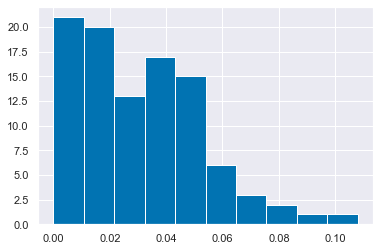

In [32]:
gender_gap[temp].abs().hist(bins=10)

In [33]:
high_gap_high_corr = gender_gap[temp].abs()[ gender_gap[temp].abs()>.05 ].index

In [34]:
low_gap_high_corr = gender_gap[temp].abs()[ gender_gap[temp].abs()<.05 ].index

In [35]:
search(BES_reduced_with_na,"al_scale|gender")

al_scale__Authoritarian    26914
gender_Female              31468
dtype: int64

In [36]:
gender_gap.sort_values().head(50)

# selfPriorities_brexit_Yes  -0.120022
# p_scot_const_vote_2011_Scottish National Party (SNP) -0.117097 (p_scot_const_vote_2011_Liberal Democrat++)
# private sector, supervisor, full time ---


# empathy10, empathy9, empathy8, empathy7, empathy4 -
# empathy5, empathy6 +

### notably, the empathy variables that don't have a gap (1,2,3) all begin "I can ..."


# lower pol attention, less likely to read newspaper

selfOccSuperviseLast_Yes                                                                                                                 -0.181702
p_job_sector_Private sector profit-seeking (e.g. public limited company, partnership)                                                    -0.179007
sectorPartner_Other public sector employer *Incl eg: - Central govt/ Civil Service/ Govt Agency - Local authority/ Local Educ Auth/sch   -0.149172
sector_Private sector firm of company Including, for example, limited companies and PLCs                                                 -0.147856
p_work_stat_Working full time (30 or more hours per week)                                                                                -0.128895
workingStatus_Working full time (30 or more hours per week)                                                                              -0.123512
selfPriorities_brexit_Yes                                                                                             

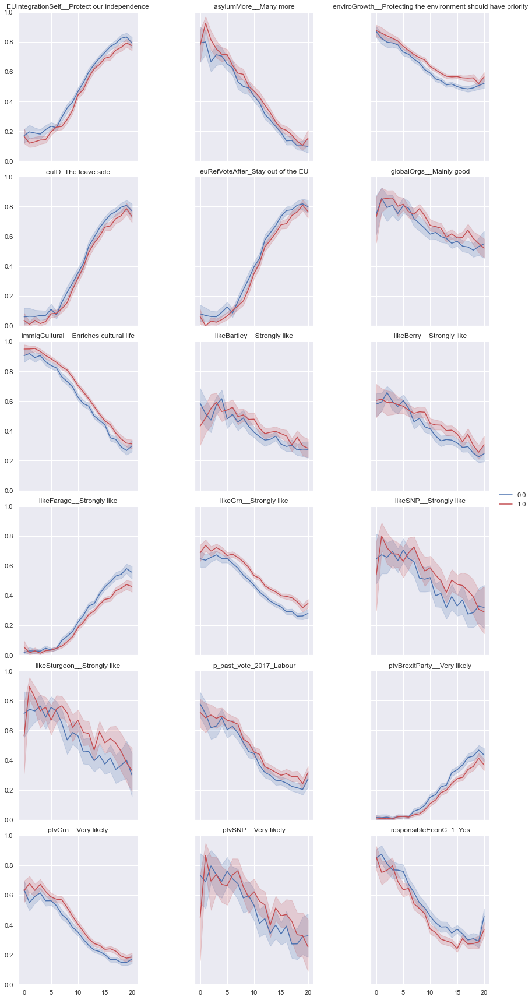

In [368]:
# data =pd.concat([authoritarianism,femaleEquality,gayEquality,blackEquality,het_or_not,df["gender"]],axis=1)
data = BES_reduced_with_na[["al_scale__Authoritarian","gender_Female"]+list(high_gap_high_corr)].astype('float')
data = data.melt(id_vars=["al_scale__Authoritarian","gender_Female"])

var_maxes = data.groupby("variable")["value"].max()

data["value"] = data["value"]/var_maxes[data["variable"]].values

g = sns.FacetGrid(data=data, col="variable",height=4,col_wrap=3)
g.map_dataframe(sns.lineplot,x="al_scale__Authoritarian",y="value",hue="gender_Female",palette={0:'b',1:'r'});
g.set_titles(col_template="{col_name}")
plt.ylim([0,1]);
g.add_legend();
# g.axes[0,0].set_xlabel('Authoritarianism');
# g.axes[0,1].set_xlabel('Authoritarianism');
# g.axes[0,2].set_xlabel('Authoritarianism');
# g.set(yticks=[0,1,2,3,4])
# g.set_yticklabels(['Not gone nearly far enough','Not gone far enough',
#                        'About right','Gone too far',
#                        'Gone much too far']);

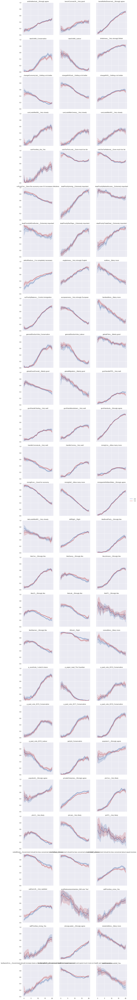

In [369]:
# data =pd.concat([authoritarianism,femaleEquality,gayEquality,blackEquality,het_or_not,df["gender"]],axis=1)
data = BES_reduced_with_na[["al_scale__Authoritarian","gender_Female"]+list(low_gap_high_corr)].astype('float')
data = data.melt(id_vars=["al_scale__Authoritarian","gender_Female"])

var_maxes = data.groupby("variable")["value"].max()

data["value"] = data["value"]/var_maxes[data["variable"]].values

g = sns.FacetGrid(data=data, col="variable",height=4,col_wrap=3)
g.map_dataframe(sns.lineplot,x="al_scale__Authoritarian",y="value",hue="gender_Female",palette={0:'b',1:'r'});
g.set_titles(col_template="{col_name}")
plt.ylim([0,1]);
g.add_legend();
# g.axes[0,0].set_xlabel('Authoritarianism');
# g.axes[0,1].set_xlabel('Authoritarianism');
# g.axes[0,2].set_xlabel('Authoritarianism');
# g.set(yticks=[0,1,2,3,4])
# g.set_yticklabels(['Not gone nearly far enough','Not gone far enough',
#                        'About right','Gone too far',
#                        'Gone much too far']);

In [ ]:
# subset of examples which *really* seem like they should be more about economic left/right

# redistSelf, privateEnterprise, govtHandouts, cutsTooFarLocal/National, deficitReduce, benefitsNotDeserved

In [39]:
search(BES_reduced_with_na,"redistSelf|privateEnterprise|deficitReduce|cutsTooFarLocal|cutsTooFarNational|govtHandouts|benefitsNotDeserved").index

Index(['cutsTooFarNational__Gone much too far',
       'cutsTooFarLocal__Gone much too far',
       'redistSelf__Government should be less concerned about equal incomes',
       'privateEnterprise__Strongly agree', 'govtHandouts__Strongly agree',
       'benefitsNotDeserved__Strongly agree',
       'deficitReduce__It is completely necessary'],
      dtype='object')

In [ ]:
# itr = pd.read_stata('file.dta', iterator=True)
# itr.variable_labels()

In [48]:
weirdly_econ_looking = ['redistSelf__Government should be less concerned about equal incomes',
                        'privateEnterprise__Strongly agree',
                        'deficitReduce__It is completely necessary',
#        'cutsTooFarNational__Gone much too far',
       'cutsTooFarLocal__Gone much too far',
        'govtHandouts__Strongly agree',
       'benefitsNotDeserved__Strongly agree',
       ]

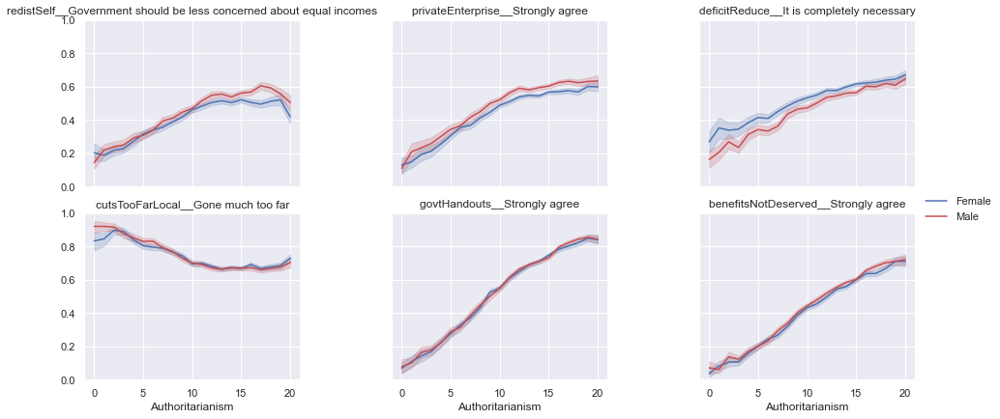

In [60]:
# data =pd.concat([authoritarianism,femaleEquality,gayEquality,blackEquality,het_or_not,df["gender"]],axis=1)
gender = BES_reduced_with_na["gender_Female"].replace({1:"Female",0:"Male"})
data = BES_reduced_with_na[["al_scale__Authoritarian"]+list(weirdly_econ_looking)].astype('float')
data["gender"] = gender
data = data.melt(id_vars=["al_scale__Authoritarian","gender"])

var_maxes = data.groupby("variable")["value"].max()

data["value"] = data["value"]/var_maxes[data["variable"]].values

g = sns.FacetGrid(data=data, col="variable",height=3,col_wrap=3,aspect=1.5)
g.map_dataframe(sns.lineplot,x="al_scale__Authoritarian",y="value",hue="gender",palette={"Female":'b',"Male":'r'});
g.set_titles(col_template="{col_name}")
plt.ylim([0,1]);
g.add_legend();
g.axes[-1].set_xlabel('Authoritarianism');
g.axes[-2].set_xlabel('Authoritarianism');
g.axes[-3].set_xlabel('Authoritarianism');
# g.set(yticks=[0,1,2,3,4])
# g.set_yticklabels(['Not gone nearly far enough','Not gone far enough',
#                        'About right','Gone too far',
#                        'Gone much too far']);

In [74]:
replace_dict = {'Private sector firm of company Including, for example, limited companies and PLCs':"Private",
       'Nationalised industry or public corporation *Including, for example, the Post Office and the BBC':"Public",
       'Other public sector employer Incl eg: - Central govt/ Civil Service/ Govt Agency - Local authority/ Local Educ Auth/sch':"Public",
       'Charity/voluntary sector Including, for example, charitable companies, churches, trade unions:':"Public",
       'Other':np.nan, 'Self-employed':"Private", 'Own your own business / company':"Private",
       "Don't know":np.nan}
sector_broad = BES_Panel["sector"].replace(replace_dict)
sector_broad.value_counts(dropna=False)


Private    16200
Public     11783
NaN         3485
Name: sector, dtype: int64

In [77]:
# BES_Panel["p_job_sector"].cat.categories
replace_dict = {'Private sector â profit-seeking (e.g. public limited company, partnership)':"Private",
       'Public sector â government owned or funded (e.g. civil service, local government, NHS, university)':"Public",
       'Third sector â non-profit, non-governmental (e.g. charity, social enterprise)':np.nan,
       "Don't know":np.nan, 'Not applicable':np.nan}
sector_narrow = BES_Panel["p_job_sector"].replace(replace_dict)
sector_narrow.value_counts(dropna=False)

NaN        16870
Private     9253
Public      5345
Name: p_job_sector, dtype: int64

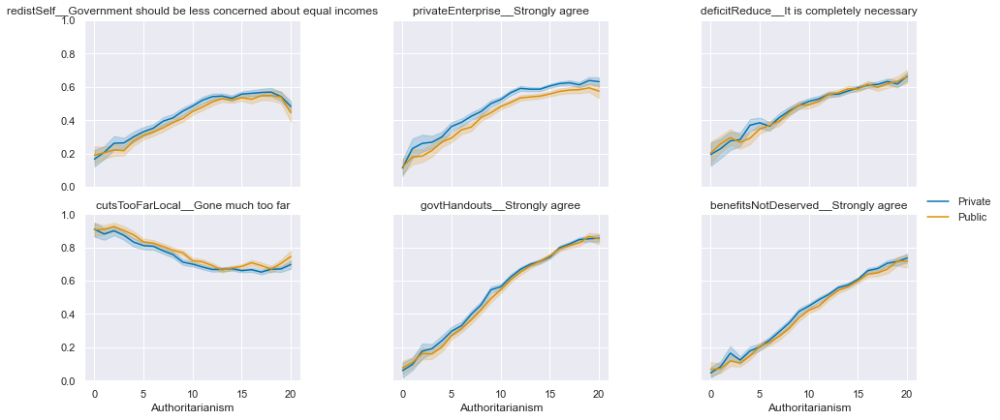

In [78]:
# data =pd.concat([authoritarianism,femaleEquality,gayEquality,blackEquality,het_or_not,df["gender"]],axis=1)
# gender = BES_reduced_with_na["gender_Female"].replace({1:"Female",0:"Male"})
data = BES_reduced_with_na[["al_scale__Authoritarian"]+list(weirdly_econ_looking)].astype('float')
data["sector_broad"] = sector_broad
data = data.melt(id_vars=["al_scale__Authoritarian","sector_broad"])

var_maxes = data.groupby("variable")["value"].max()

data["value"] = data["value"]/var_maxes[data["variable"]].values

g = sns.FacetGrid(data=data, col="variable",height=3,col_wrap=3,aspect=1.5)
g.map_dataframe(sns.lineplot,x="al_scale__Authoritarian",y="value",hue="sector_broad");
g.set_titles(col_template="{col_name}")
plt.ylim([0,1]);
g.add_legend();
g.axes[-1].set_xlabel('Authoritarianism');
g.axes[-2].set_xlabel('Authoritarianism');
g.axes[-3].set_xlabel('Authoritarianism');
# g.set(yticks=[0,1,2,3,4])
# g.set_yticklabels(['Not gone nearly far enough','Not gone far enough',
#                        'About right','Gone too far',
#                        'Gone much too far']);

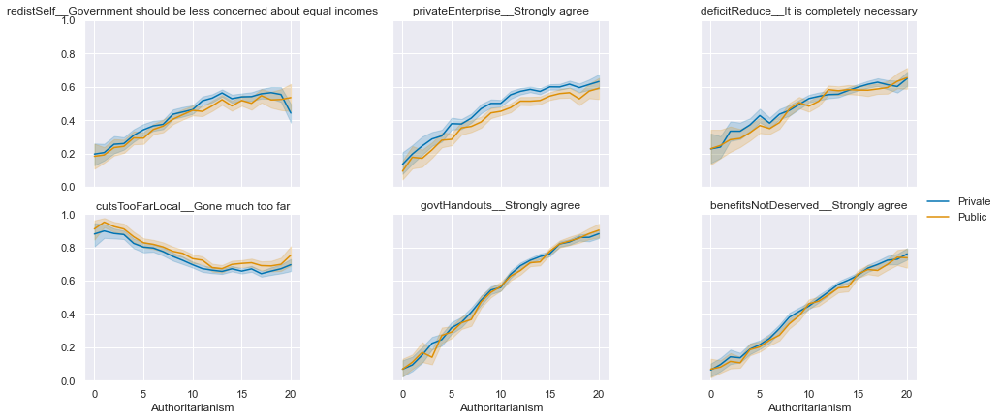

In [79]:
# data =pd.concat([authoritarianism,femaleEquality,gayEquality,blackEquality,het_or_not,df["gender"]],axis=1)
# gender = BES_reduced_with_na["gender_Female"].replace({1:"Female",0:"Male"})
data = BES_reduced_with_na[["al_scale__Authoritarian"]+list(weirdly_econ_looking)].astype('float')
data["sector_narrow"] = sector_narrow
data = data.melt(id_vars=["al_scale__Authoritarian","sector_narrow"])

var_maxes = data.groupby("variable")["value"].max()

data["value"] = data["value"]/var_maxes[data["variable"]].values

g = sns.FacetGrid(data=data, col="variable",height=3,col_wrap=3,aspect=1.5)
g.map_dataframe(sns.lineplot,x="al_scale__Authoritarian",y="value",hue="sector_narrow");
g.set_titles(col_template="{col_name}")
plt.ylim([0,1]);
g.add_legend();
g.axes[-1].set_xlabel('Authoritarianism');
g.axes[-2].set_xlabel('Authoritarianism');
g.axes[-3].set_xlabel('Authoritarianism');
# g.set(yticks=[0,1,2,3,4])
# g.set_yticklabels(['Not gone nearly far enough','Not gone far enough',
#                        'About right','Gone too far',
#                        'Gone much too far']);

In [ ]:
### Okay - what's the programme here?

In [43]:
search(df,"asylumMore")

Series([], dtype: float64)

In [42]:
search(df,"gay|immig|asylum")

immigEcon      30949
immigSelf      30949
immigCon       30949
immigLab       30949
immigLD        30949
immigSNP        3035
immigPC         1861
immigBrexit    30949
immigGreen     30949
gayEquality    30949
dtype: int64

In [44]:
gayEquality = df["gayEquality"].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)
immigSelf = df["immigSelf"].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)
immigEcon = df["immigEcon"].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)





In [46]:
## save these somewhere

def m(x, w):
    """Weighted Mean"""
    return np.sum(x * w) / np.sum(w)

def cov(x, y, w):
    """Weighted Covariance"""
    return np.sum(w * (x - m(x, w)) * (y - m(y, w))) / np.sum(w)

def corr(x, y, w):
    """Weighted Correlation"""
    return cov(x, y, w) / np.sqrt(cov(x, x, w) * cov(y, y, w))

gayEquality.corr(immigSelf) # -0.5110263894971507
corr(gayEquality,immigSelf,df["wt"]) # -0.37526624207362114

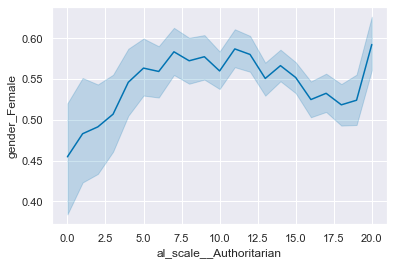

In [64]:
sns.lineplot(x=BES_reduced_with_na["al_scale__Authoritarian"],y=BES_reduced_with_na["gender_Female"])

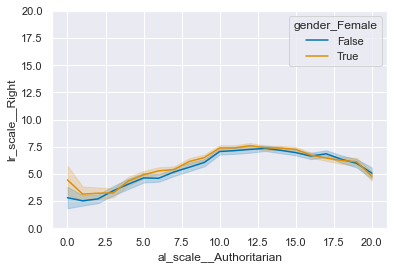

In [67]:
sns.lineplot(x=BES_reduced_with_na["al_scale__Authoritarian"],y=BES_reduced_with_na["lr_scale__Right"],hue=BES_reduced_with_na["gender_Female"])
plt.ylim([0,20]);

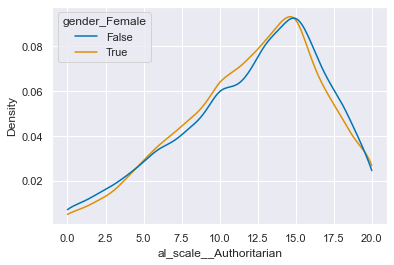

In [73]:
### check for some manual confounds

sns.kdeplot(x=BES_reduced_with_na["al_scale__Authoritarian"],hue=BES_reduced_with_na["gender_Female"],cut=0,common_norm=False)


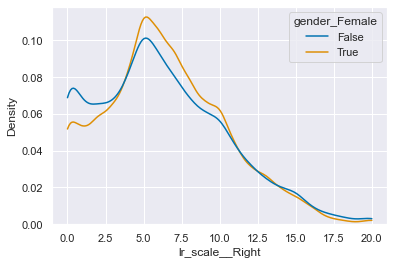

In [74]:
sns.kdeplot(x=BES_reduced_with_na["lr_scale__Right"],hue=BES_reduced_with_na["gender_Female"],cut=0,common_norm=False)

In [51]:
search(BES_reduced_with_na,"al_scale|lr_scale|gender")

lr_scale__Right            27872
al_scale__Authoritarian    26914
gender_Female              31468
dtype: int64

In [36]:
pan_dataset_values = pd.read_pickle( "E:\\Users\\Gamer\\Documents\\GitHub\\BES_analysis\\BES_analysis_code\\small data files\\pan_dataset_allr_valuesW19.zip", compression='zip' )

In [152]:
variable_inf = pd.DataFrame(columns = ["corr_with_al","corr_with_lr","total_gender_gap",
                                       "gender_gap_al25","gender_gap_al50","gender_gap_al75","gender_gap_al100",
                                       "gender_gap_lr25","gender_gap_lr50","gender_gap_lr75","gender_gap_lr100",
                                       "sample_size",
                                      ])

al_scale = pan_dataset_values["Social: Liberalism(0) <-> Conservatism(200){uniform}"]
lr_scale = pan_dataset_values["Economic: Left(0) <-> Right(200){uniform}"]
al_scale_quarts = pd.qcut(al_scale,4).cat.codes.replace(-1,np.nan)
lr_scale_quarts = pd.qcut(lr_scale,4).cat.codes.replace(-1,np.nan)
# precomputed lr and lr quartiles
gender = BES_reduced_with_na["gender_Female"].replace({1:"Female",0:"Male"})

# note sample size!

for variable in BES_reduced_with_na.columns:
    var_max = BES_reduced_with_na[variable].max()
    rows = [
        BES_reduced_with_na[variable].corr(al_scale),
        BES_reduced_with_na[variable].corr(lr_scale),
        # gender gap Male-Female
        BES_reduced_with_na[variable].groupby(gender).mean().diff().loc["Male"]/var_max,
        BES_reduced_with_na[variable].groupby([gender,al_scale_quarts]).mean().loc[:,0].diff().loc["Male"]/var_max,
        BES_reduced_with_na[variable].groupby([gender,al_scale_quarts]).mean().loc[:,1].diff().loc["Male"]/var_max,
        BES_reduced_with_na[variable].groupby([gender,al_scale_quarts]).mean().loc[:,2].diff().loc["Male"]/var_max,
        BES_reduced_with_na[variable].groupby([gender,al_scale_quarts]).mean().loc[:,3].diff().loc["Male"]/var_max,

        BES_reduced_with_na[variable].groupby([gender,lr_scale_quarts]).mean().loc[:,0].diff().loc["Male"]/var_max,
        BES_reduced_with_na[variable].groupby([gender,lr_scale_quarts]).mean().loc[:,1].diff().loc["Male"]/var_max,
        BES_reduced_with_na[variable].groupby([gender,lr_scale_quarts]).mean().loc[:,2].diff().loc["Male"]/var_max,
        BES_reduced_with_na[variable].groupby([gender,lr_scale_quarts]).mean().loc[:,3].diff().loc["Male"]/var_max,
        # sample size
        (BES_reduced_with_na[variable].notnull()&al_scale.notnull()&lr_scale.notnull()&gender.notnull()).sum(),
        
    ]
    variable_inf.loc[variable] = rows

In [153]:
variable_inf

,corr_with_al,corr_with_lr,total_gender_gap,gender_gap_al25,gender_gap_al50,gender_gap_al75,gender_gap_al100,gender_gap_lr25,gender_gap_lr50,gender_gap_lr75,gender_gap_lr100,sample_size
turnoutUKGeneralW1__Very likely that I will vote,-0.047823,0.019833,0.037986,0.008517,0.033442,0.054950,0.048159,0.026797,0.039872,0.034900,0.043715,29363.0
turnoutUKGeneralW2__Very likely that I will vote,-0.059585,0.004727,0.031601,0.007757,0.024681,0.045751,0.042469,0.021462,0.032575,0.027477,0.037505,29377.0
turnoutUKGeneralW3__Very likely that I will vote,-0.045245,0.008440,0.035297,0.012980,0.041540,0.040708,0.041311,0.023794,0.037887,0.035640,0.037412,27196.0
turnoutUKGeneralW4__Very likely that I will vote,-0.044764,-0.000311,0.037006,0.013066,0.033528,0.051812,0.039838,0.033257,0.034538,0.035418,0.033418,30678.0
turnoutUKGeneralW5__Very likely that I will vote,-0.055799,0.008870,0.021171,0.002503,0.021643,0.032988,0.024708,0.017893,0.024583,0.019664,0.016714,26785.0
...,...,...,...,...,...,...,...,...,...,...,...,...
responsibleEducationNoneW3_Yes,-0.055270,0.040834,-0.008665,-0.015558,-0.026250,0.003644,0.002921,0.006264,-0.004471,-0.017682,-0.017628,21521.0
achieveReduceImmigLabW18_Yes,-0.009991,-0.082052,-0.007207,0.010592,-0.002333,-0.019880,-0.014035,-0.014945,-0.003330,-0.000932,-0.011112,26955.0
achieveReduceImmigConW18_Yes,0.246441,0.226035,0.019254,-0.024169,0.027821,0.038987,0.044502,-0.004775,0.024510,0.039096,0.046764,26955.0
partyContactConW3_Yes,0.228342,0.315888,0.004665,-0.037004,0.035345,0.017260,0.031713,-0.036475,0.020287,0.019524,0.040754,5013.0


In [18]:
drop_list = search(BES_reduced_with_na,"al_scale|lr_scale|^gender_|^al\dW|^lr\dW").index

In [130]:
search(BES_reduced_with_na,"al_scale|lr_scale|^gender_|^al\dW|^lr\dW")

lr1W6__Strongly agree         28906
lr2W6__Strongly agree         29229
lr3W6__Strongly agree         29155
lr4W6__Strongly agree         29443
lr5W6__Strongly agree         29096
                              ...  
lr_scaleW16__Right            33450
al_scaleW16__Authoritarian    32671
lr_scaleW17__Right            30488
al_scaleW17__Authoritarian    29773
gender_Female                 96090
Length: 97, dtype: int64

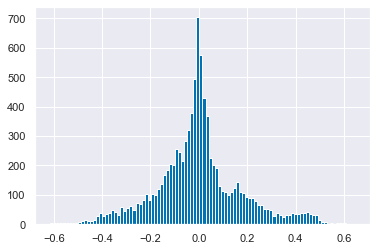

In [132]:
variable_inf.drop(drop_list).corr_with_al.hist(bins=100)

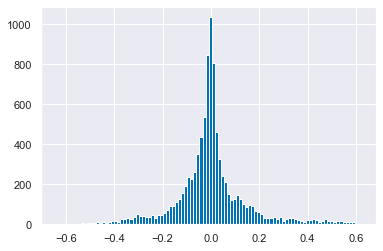

In [133]:
variable_inf.drop(drop_list).corr_with_lr.hist(bins=100)

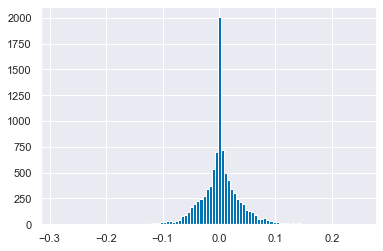

In [139]:
variable_inf.drop(drop_list).total_gender_gap.hist(bins=100)

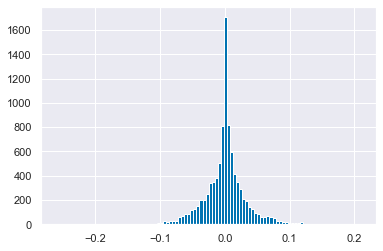

In [144]:
variable_inf.drop(drop_list).gender_gap_al25.hist(bins=100)

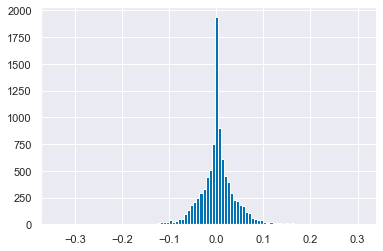

In [145]:
variable_inf.drop(drop_list).gender_gap_al50.hist(bins=100)

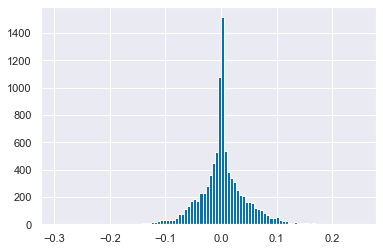

In [146]:
variable_inf.drop(drop_list).gender_gap_al75.hist(bins=100)

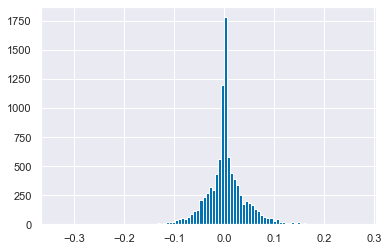

In [147]:
variable_inf.drop(drop_list).gender_gap_al100.hist(bins=100)

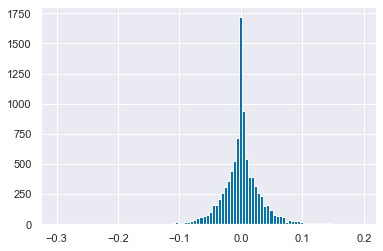

In [148]:
variable_inf.drop(drop_list).gender_gap_lr25.hist(bins=100)

In [156]:
variable_inf.corr()

,corr_with_al,corr_with_lr,total_gender_gap,gender_gap_al25,gender_gap_al50,gender_gap_al75,gender_gap_al100,gender_gap_lr25,gender_gap_lr50,gender_gap_lr75,gender_gap_lr100,sample_size
corr_with_al,1.000000,0.536510,0.073472,-0.015267,0.102159,0.134087,0.136418,-0.067026,0.159923,0.215154,0.189223,0.042535
corr_with_lr,0.536510,1.000000,0.203523,0.131763,0.217547,0.251855,0.235474,0.085393,0.307166,0.363063,0.372834,-0.013982
total_gender_gap,0.073472,0.203523,1.000000,0.889536,0.965345,0.965451,0.945073,0.926798,0.957866,0.952757,0.933051,-0.034058
gender_gap_al25,-0.015267,0.131763,0.889536,1.000000,0.865091,0.793918,0.731424,0.878768,0.857250,0.826566,0.788077,-0.025673
gender_gap_al50,0.102159,0.217547,0.965345,0.865091,1.000000,0.915551,0.884726,0.884584,0.926156,0.927210,0.911090,-0.039075
gender_gap_al75,0.134087,0.251855,0.965451,0.793918,0.915551,1.000000,0.930365,0.859889,0.927767,0.937911,0.929358,-0.028597
gender_gap_al100,0.136418,0.235474,0.945073,0.731424,0.884726,0.930365,1.000000,0.860524,0.904163,0.913114,0.902559,-0.031487
gender_gap_lr25,-0.067026,0.085393,0.926798,0.878768,0.884584,0.859889,0.860524,1.000000,0.874476,0.830456,0.769585,-0.023946
gender_gap_lr50,0.159923,0.307166,0.957866,0.857250,0.926156,0.927767,0.904163,0.874476,1.000000,0.928406,0.879640,-0.037396
gender_gap_lr75,0.215154,0.363063,0.952757,0.826566,0.927210,0.937911,0.913114,0.830456,0.928406,1.000000,0.918708,-0.036032


In [155]:
variable_inf.abs().corr()

,corr_with_al,corr_with_lr,total_gender_gap,gender_gap_al25,gender_gap_al50,gender_gap_al75,gender_gap_al100,gender_gap_lr25,gender_gap_lr50,gender_gap_lr75,gender_gap_lr100,sample_size
corr_with_al,1.000000,0.381702,0.157680,0.151523,0.176351,0.178488,0.152134,0.138319,0.186165,0.207831,0.213790,-0.071470
corr_with_lr,0.381702,1.000000,0.109174,0.145525,0.121488,0.135548,0.098337,0.052671,0.187143,0.225376,0.230618,-0.125329
total_gender_gap,0.157680,0.109174,1.000000,0.841422,0.948326,0.947730,0.919242,0.900375,0.936830,0.928697,0.901819,-0.070066
gender_gap_al25,0.151523,0.145525,0.841422,1.000000,0.820083,0.731993,0.672921,0.835944,0.803403,0.764507,0.725244,-0.100605
gender_gap_al50,0.176351,0.121488,0.948326,0.820083,1.000000,0.883858,0.843371,0.849882,0.896878,0.896348,0.874389,-0.098303
gender_gap_al75,0.178488,0.135548,0.947730,0.731993,0.883858,1.000000,0.901249,0.816957,0.895486,0.909268,0.897620,-0.103186
gender_gap_al100,0.152134,0.098337,0.919242,0.672921,0.843371,0.901249,1.000000,0.822200,0.865711,0.877912,0.858216,-0.083968
gender_gap_lr25,0.138319,0.052671,0.900375,0.835944,0.849882,0.816957,0.822200,1.000000,0.840518,0.786811,0.715800,-0.049253
gender_gap_lr50,0.186165,0.187143,0.936830,0.803403,0.896878,0.895486,0.865711,0.840518,1.000000,0.900544,0.831723,-0.083900
gender_gap_lr75,0.207831,0.225376,0.928697,0.764507,0.896348,0.909268,0.877912,0.786811,0.900544,1.000000,0.881989,-0.109378


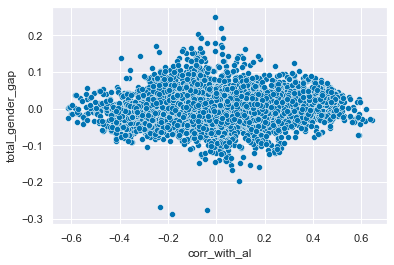

In [158]:
sns.scatterplot(variable_inf["corr_with_al"].drop(drop_list),variable_inf["total_gender_gap"].drop(drop_list),)

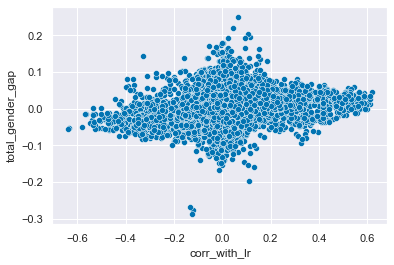

In [163]:
sns.scatterplot(variable_inf["corr_with_lr"].drop(drop_list),variable_inf["total_gender_gap"].drop(drop_list),)

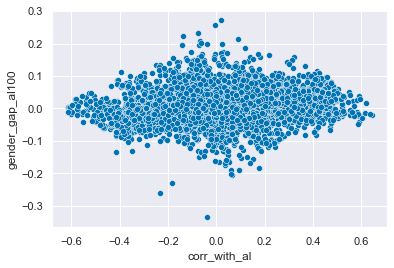

In [159]:
sns.scatterplot(variable_inf["corr_with_al"].drop(drop_list),variable_inf["gender_gap_al100"].drop(drop_list),)

In [164]:
variable_inf["gender_gap_al100"].drop(drop_list).sort_values()

affempathyIRTW14                                                      -0.335501
subjectHEW1_W3_Humanities, social sciences, psychology or education   -0.260706
subjectHEW15_Humanities, social sciences, psychology or education     -0.229853
ns_sec_analyticW19_Intermediate occupations                           -0.204289
euKnow4W8_False                                                       -0.203002
                                                                         ...   
JACS_subject_labelW19_Mathematical sciences                            0.214665
euKnow6W15_False                                                       0.222659
selfOccSuperviseLastW19_Yes                                            0.231452
subjectHEW15_Engineering, Mathematics or Natural sciences              0.257294
subjectHEW1_W3_Engineering, Mathematics or Natural sciences            0.273325
Name: gender_gap_al100, Length: 9423, dtype: float64

In [165]:
variable_inf["gender_gap_al25"].drop(drop_list).sort_values()

subjectHEW15_Humanities, social sciences, psychology or education                            -0.260225
subjectHEW1_W3_Humanities, social sciences, psychology or education                          -0.240033
affempathyIRTW14                                                                             -0.221386
mpVoteConstSelfW17_MP should vote according to the opinion of voters in their constituency   -0.219315
cuKnow3W16_False                                                                             -0.193434
                                                                                                ...   
freeSpeechRacistElectionW15__Definitely                                                       0.175988
certaintyEULDW8__Very certain                                                                 0.175997
euKnow5W8_False                                                                               0.185162
subjectHEW1_W3_Engineering, Mathematics or Natural sciences              

In [166]:
variable_inf.to_pickle( "E:\\Users\\Gamer\\Documents\\GitHub\\BES_analysis\\BES_analysis_code\\small data files\\gender_gap_var_inf.zip", compression='zip' )

In [ ]:
# total_gender_gap
# subjectHEW15_Humanities, social sciences, psychology or education     -0.288131
# affempathyIRTW14                                                      -0.275554
# subjectHEW1_W3_Humanities, social sciences, psychology or education   -0.267807
# subjectHEW1_W3_Engineering, Mathematics or Natural sciences            0.219991
# subjectHEW15_Engineering, Mathematics or Natural sciences              0.251137

In [13]:
variable_inf = pd.read_pickle( "E:\\Users\\Gamer\\Documents\\GitHub\\BES_analysis\\BES_analysis_code\\small data files\\gender_gap_var_inf.zip", compression='zip' )

In [9]:
al_scale = pan_dataset_values["Social: Liberalism(0) <-> Conservatism(200){uniform}"]

lr_scale = pan_dataset_values["Economic: Left(0) <-> Right(200){uniform}"]
# al_scale_quarts = pd.qcut(al_scale,4).cat.codes.replace(-1,np.nan)
# lr_scale_quarts = pd.qcut(lr_scale,4).cat.codes.replace(-1,np.nan)
# # precomputed lr and lr quartiles
gender = BES_reduced_with_na["gender_Female"].replace({1:"Female",0:"Male"})

In [41]:
frac=.05

pos_al_corr = variable_inf["corr_with_al"]> variable_inf["corr_with_al"].drop(drop_list).quantile(1-frac)
neg_al_corr = variable_inf["corr_with_al"]< variable_inf["corr_with_al"].drop(drop_list).quantile(frac)
pos_al100_gender_gap = variable_inf["gender_gap_al100"]> variable_inf["gender_gap_al100"].drop(drop_list).quantile(1-frac)
neg_al100_gender_gap = variable_inf["gender_gap_al100"]< variable_inf["gender_gap_al100"].drop(drop_list).quantile(frac)


In [42]:
BES_reduced_with_na.columns[pos_al_corr&pos_al100_gender_gap&(variable_inf['sample_size']>10000)]

Index(['likeUKIPW1__Strongly like', 'ptvUKIPW1__Very likely',
       'likeFarageW2__Strongly like', 'likeUKIPW2__Strongly like',
       'ptvUKIPW2__Very likely', 'likeFarageW3__Strongly like',
       'ptvUKIPW3__Very likely', 'likeFarageW4__Strongly like',
       'ptvUKIPW4__Very likely', 'likeFarageW5__Strongly like',
       'ptvUKIPW5__Very likely', 'likeFarageW6__Strongly like',
       'ptvUKIPW6__Very likely', 'likeFarageW7__Strongly like',
       'ptvUKIPW7__Very likely', 'likeFarageW8__Strongly like',
       'likeFarageW9__Strongly like', 'ptvUKIPW9__Very likely',
       'likeFarageW10__Strongly like', 'womenJobsW10__Strongly agree',
       'ptvUKIPW10__Very likely', 'likeFarageW11__Strongly like',
       'likeFarageW15__Strongly like', 'likeFarageW16__Strongly like',
       'noDealLongTermW16__Extremely good',
       'gayEqualityW16__Gone much too far', 'likeFarageW17__Strongly like',
       'gayEqualityW17__Gone much too far', 'likeFarageW18__Strongly like',
       'likeFarageW

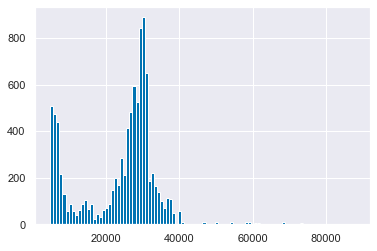

In [36]:
variable_inf['sample_size']

In [227]:

# al_scale = pan_dataset_values["Social: Liberalism(0) <-> Conservatism(200){uniform}"]
# lr_scale = pan_dataset_values["Economic: Left(0) <-> Right(200){uniform}"]
# al_scale_quarts = pd.qcut(al_scale,4).cat.codes.replace(-1,np.nan)
# lr_scale_quarts = pd.qcut(lr_scale,4).cat.codes.replace(-1,np.nan)
# # precomputed lr and lr quartiles
# gender = BES_reduced_with_na["gender_Female"].replace({1:"Female",0:"Male"})

def plot_vars_against_gender(var_list, al_scale=al_scale):

    # data =pd.concat([authoritarianism,femaleEquality,gayEquality,blackEquality,het_or_not,df["gender"]],axis=1)
    gender = BES_reduced_with_na["gender_Female"].replace({1:"Female",0:"Male"})
    data = pd.concat([al_scale, BES_reduced_with_na[list(var_list)].astype('float')] ,axis=1)
    data["gender"] = gender
    data = data.melt(id_vars=[al_scale.name,"gender"])

    var_maxes = data.groupby("variable")["value"].max()
    var_mins = data.groupby("variable")["value"].min()

    data["value"] = (data["value"]-var_mins[data["variable"]].values)/(var_maxes[data["variable"]].values-var_mins[data["variable"]].values)
    from textwrap import wrap
    data["variable"] = data["variable"].apply(lambda x: "\n".join(wrap(x,30)))
    g = sns.FacetGrid(data=data, col="variable",height=3,col_wrap=3,aspect=1.5)
    g.map_dataframe(sns.lineplot,x=al_scale.name,y="value",hue="gender",palette={"Female":'b',"Male":'r'});
    g.set_titles(col_template="{col_name}")
    plt.ylim([0,1]);
    g.add_legend();
    g.axes[-1].set_xlabel('Authoritarianism');
    if len(var_list)>1:
        g.axes[-2].set_xlabel('Authoritarianism');
    if len(var_list)>2:
        g.axes[-3].set_xlabel('Authoritarianism');
    # g.set(yticks=[0,1,2,3,4])
    # g.set_yticklabels(['Not gone nearly far enough','Not gone far enough',
    #                        'About right','Gone too far',
    #                        'Gone much too far']);

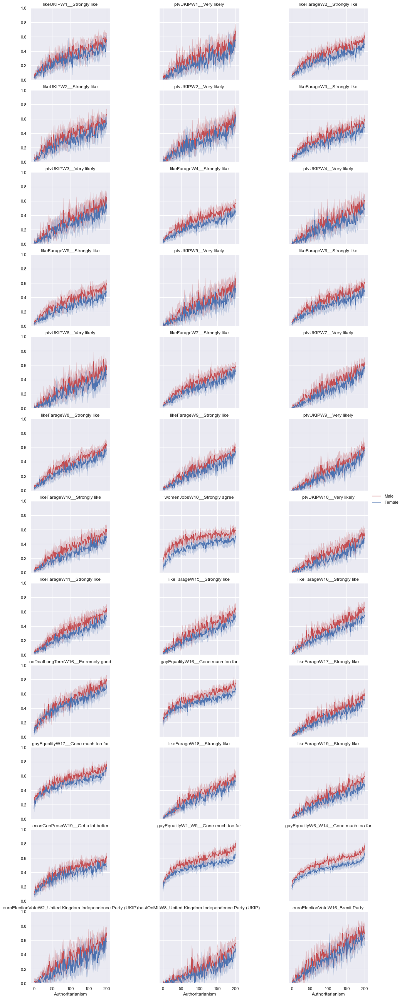

In [49]:
var_list = BES_reduced_with_na.columns[pos_al_corr&pos_al100_gender_gap&(variable_inf['sample_size']>10000)].drop(drop_list,errors='ignore')
plot_vars_against_gender(var_list)

# likeUKIP, ptvUKIP, likeFarage
# euroElectionVote_UKIP, bestOnMII_UKIP, euroElectionVote_BrexitParty

# womenJobs
#    Nowadays, women are given unfair advantages over men when applying for jobs
# gayEquality

# noDealLongTermW16_extremely good
# econGenProsp W19_get a lot better

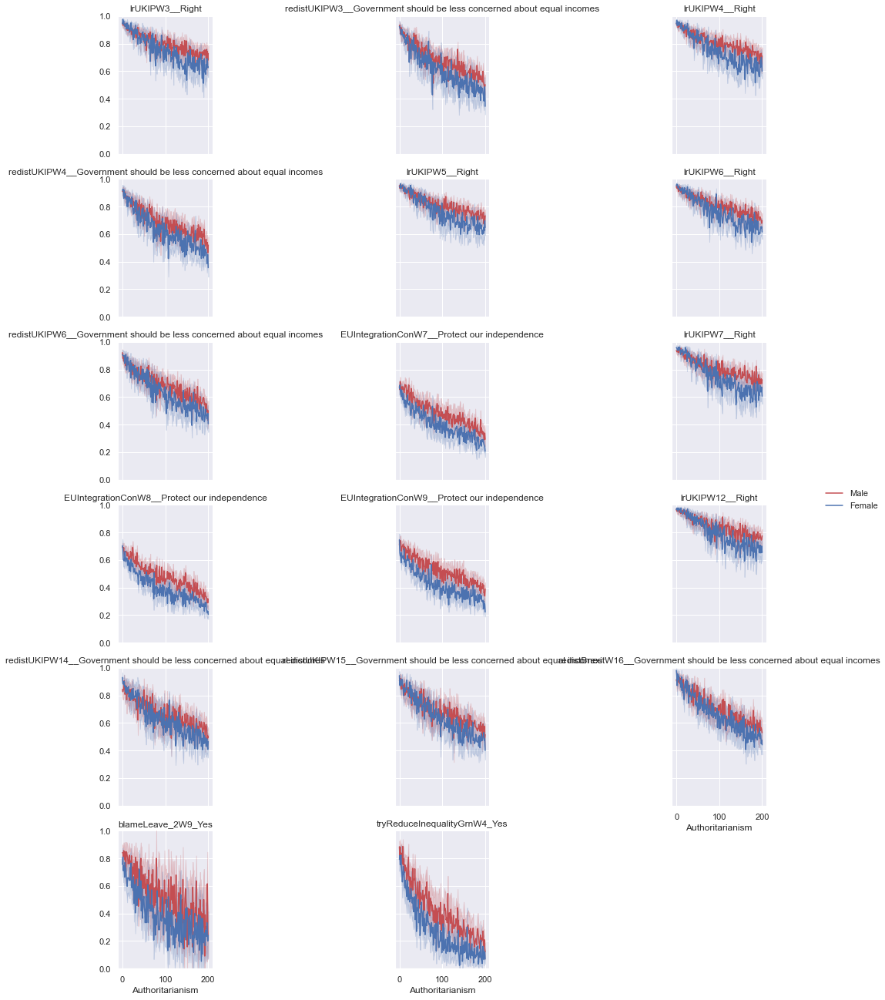

In [50]:
var_list = BES_reduced_with_na.columns[neg_al_corr&pos_al100_gender_gap&(variable_inf['sample_size']>10000)].drop(drop_list,errors='ignore')
plot_vars_against_gender(var_list)

# lrUKIP, redistUKIP, redistBrexit
# EUIntegrationCon
# blameLeave_2
#    blameLeave_2 □ The Conservatives
# tryReduceInequalityGrn

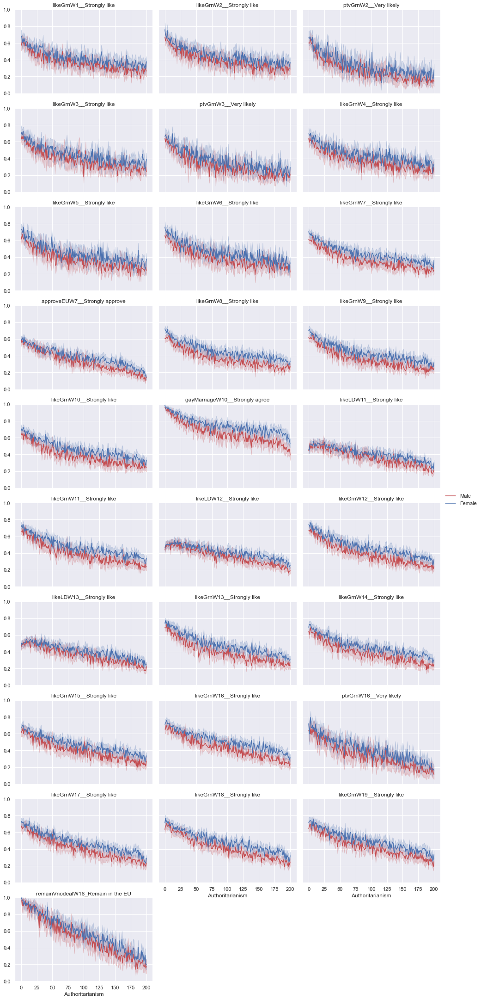

In [51]:
var_list = BES_reduced_with_na.columns[neg_al_corr&neg_al100_gender_gap&(variable_inf['sample_size']>10000)].drop(drop_list,errors='ignore')
plot_vars_against_gender(var_list)

# likeGrn/ptvGrn (women>men), likeLD
# approveEU, remainVnodeal
# gayMarriage

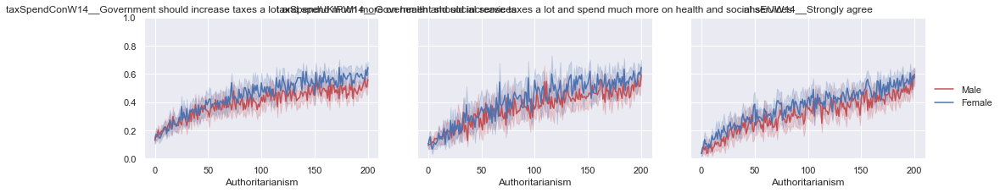

In [52]:
var_list = BES_reduced_with_na.columns[pos_al_corr&neg_al100_gender_gap&(variable_inf['sample_size']>10000)].drop(drop_list,errors='ignore')
plot_vars_against_gender(var_list)
#  'taxSpendConW14__Government should increase taxes a lot and spend much more on health and social services',
#  'taxSpendUKIPW14__Government should increase taxes a lot and spend much more on health and social services',
#  'nhsEUW14__Strongly agree'
#      The government will spend £350 million more every week on the NHS as a result of Brexit

In [53]:
var_list

Index(['taxSpendConW14__Government should increase taxes a lot and spend much more on health and social services',
       'taxSpendUKIPW14__Government should increase taxes a lot and spend much more on health and social services',
       'nhsEUW14__Strongly agree'],
      dtype='object')

In [151]:
# variable_inf

In [142]:
variable_inf.drop(drop_list).total_gender_gap.sort_values().head(10)

subjectHEW15_Humanities, social sciences, psychology or education                                                                   -0.288131
affempathyIRTW14                                                                                                                    -0.275554
subjectHEW1_W3_Humanities, social sciences, psychology or education                                                                 -0.267807
successReduceInequalityDKW4_Yes                                                                                                     -0.197775
ns_sec_analyticW19_Intermediate occupations                                                                                         -0.167818
successReduceInequalityDKW12_Yes                                                                                                    -0.157685
tryReduceInequalityDKW4_Yes                                                                                                         -0.154044
ns_sec

In [143]:
variable_inf.drop(drop_list).total_gender_gap.sort_values().tail(10)

euSources_4W7_Yes                                              0.171844
certaintyEUGreenW7__Very certain                               0.173432
polKnowAssadW10_President of Syria                             0.180371
certaintyEULDW8__Very certain                                  0.180527
certaintyEULDW7__Very certain                                  0.191934
selfOccSuperviseLastW1_Yes                                     0.193973
selfOccSuperviseLastW6_Yes                                     0.196666
selfOccSuperviseLastW19_Yes                                    0.203530
subjectHEW1_W3_Engineering, Mathematics or Natural sciences    0.219991
subjectHEW15_Engineering, Mathematics or Natural sciences      0.251137
Name: total_gender_gap, dtype: float64

In [110]:
BES_reduced_with_na["turnoutUKGeneralW1__Very likely that I will vote"].groupby([gender,al_scale_quarts]).mean().loc[:,1].diff().loc["Male"]

0.13376641

In [101]:
BES_reduced_with_na["turnoutUKGeneralW1__Very likely that I will vote"].groupby(gender).mean()

gender_Female
Female    3.432878
Male      3.584824
Name: turnoutUKGeneralW1__Very likely that I will vote, dtype: float32

id
1        3
2        1
3        2
4        2
5        1
        ..
98447    1
98448    0
98449    0
98450    2
98451    2
Length: 97006, dtype: int8

In [80]:
BES_reduced_with_na

,turnoutUKGeneralW1__Very likely that I will vote,turnoutUKGeneralW2__Very likely that I will vote,turnoutUKGeneralW3__Very likely that I will vote,turnoutUKGeneralW4__Very likely that I will vote,turnoutUKGeneralW5__Very likely that I will vote,turnoutUKGeneralW7__Very likely that I will vote,turnoutUKGeneralW8__Very likely that I will vote,turnoutUKGeneralW9__Very likely that I will vote,turnoutUKGeneralW10__Very likely that I will vote,turnoutUKGeneralW11__Very likely that I will vote,...,partyContactLabW3_Yes,responsibleNHSLabourW3_Yes,responsibleNHSLibDemsW3_Yes,responsibleNHSNoneW3_Yes,responsibleEducationLabW3_Yes,responsibleEducationNoneW3_Yes,achieveReduceImmigLabW18_Yes,achieveReduceImmigConW18_Yes,partyContactConW3_Yes,partyContact1W3_Yes
id,,,,,,,,,,,,,,,,,,,,,
1,4.0,4.0,NaN,4.0,4.0,4.0,4.0,4.0,4.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,4.0,NaN,4.0,4.0,4.0,4.0,4.0,3.0,4.0,4.0,...,NaN,1.0,0.0,0.0,1.0,0.0,0.0,0.0,NaN,0.0
3,4.0,4.0,4.0,4.0,4.0,4.0,NaN,NaN,3.0,1.0,...,NaN,0.0,0.0,0.0,0.0,1.0,NaN,NaN,NaN,0.0
4,4.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,4.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98447,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
98448,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
98449,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
### is there another/better measure of difference between Male/Female distributions x Authoritarianism?

In [91]:
al_scale = pan_dataset_values["Social: Liberalism(0) <-> Conservatism(200){uniform}"]
lr_scale = pan_dataset_values["Economic: Left(0) <-> Right(200){uniform}"]
al_scale_quarts = pd.qcut(pan_dataset_values["Social: Liberalism <-> Conservatism{gaussian-ish}complete_fully"],4).cat.codes.replace(-1,np.nan)
lr_scale_quarts = pd.qcut(pan_dataset_values["Economic: Left <-> Right{gaussian-ish}complete_fully"],4).cat.codes.replace(-1,np.nan)

id
1       -1.913311
2        1.929016
3       -0.313073
4        0.643054
5        1.004469
           ...   
98447    0.217387
98448    0.791833
98449   -0.789732
98450   -0.056723
98451   -0.351287
Name: Economic: Left <-> Right{gaussian-ish}complete_fully, Length: 97006, dtype: float64

In [ ]:
## decide a quantisation level q
# then integrate absolute differences for Male vs Female distributions over q

In [ ]:
# gender

In [41]:
search(BES_reduced_with_na,"gender")

genderRolesW10__Strongly agree    29674
impGenderW14__Very important       7462
gender_Female                     96090
dtype: int64

In [ ]:
BES_reduced_with_na["gender_Female"]

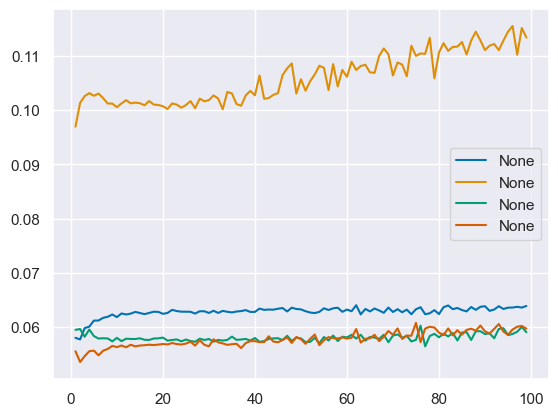

In [72]:
genderdiff_by_q =pd.Series()
for test_var in ["genderRolesW10__Strongly agree","impGenderW14__Very important","nhsEUW14__Strongly agree","likeGrnW1__Strongly like"]:
    for q in range(1,100):

        al_scale_quarts = pd.qcut(al_scale,q).cat.codes.replace(-1,np.nan)
        genderdiff_by_q.loc[q]=(BES_reduced_with_na[test_var][BES_reduced_with_na["gender_Female"]==1].groupby(al_scale_quarts).mean()
                                     -BES_reduced_with_na[test_var][BES_reduced_with_na["gender_Female"]==0].groupby(al_scale_quarts).mean()).abs().mean()/BES_reduced_with_na[test_var].max()

    genderdiff_by_q.plot()
plt.legend()

In [100]:
# q= 20
# al_scale_twent = pd.qcut(al_scale,20).cat.codes.replace(-1,np.nan)
# lr_scale_twent = pd.qcut(lr_scale,20).cat.codes.replace(-1,np.nan)

al_scale_twent = pd.qcut(pan_dataset_values["Social: Liberalism <-> Conservatism{gaussian-ish}complete_fully"],20).cat.codes.replace(-1,np.nan)
al_scale_twent.name = "Social: Liberalism(0) <-> Conservatism(20)"
lr_scale_twent = pd.qcut(pan_dataset_values["Economic: Left <-> Right{gaussian-ish}complete_fully"],20).cat.codes.replace(-1,np.nan)
lr_scale_twent.name = "Economic: Left(0) <-> Right(20)"

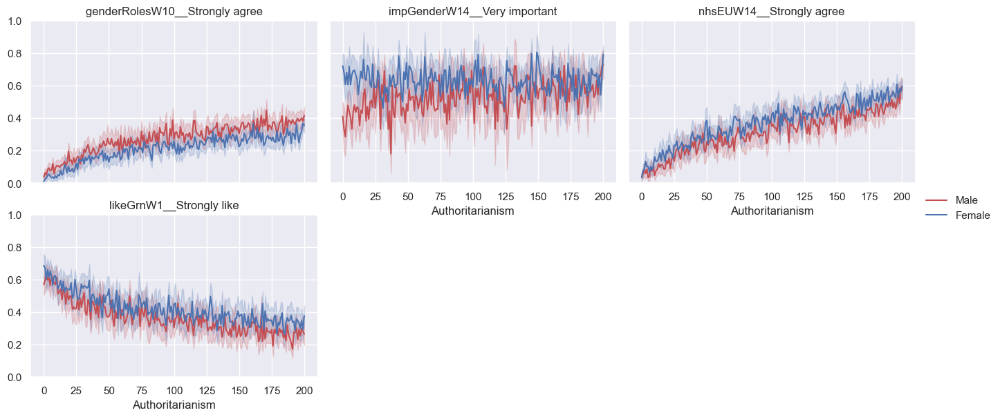

In [77]:
var_list = ["genderRolesW10__Strongly agree","impGenderW14__Very important","nhsEUW14__Strongly agree","likeGrnW1__Strongly like"]
plot_vars_against_gender(var_list)

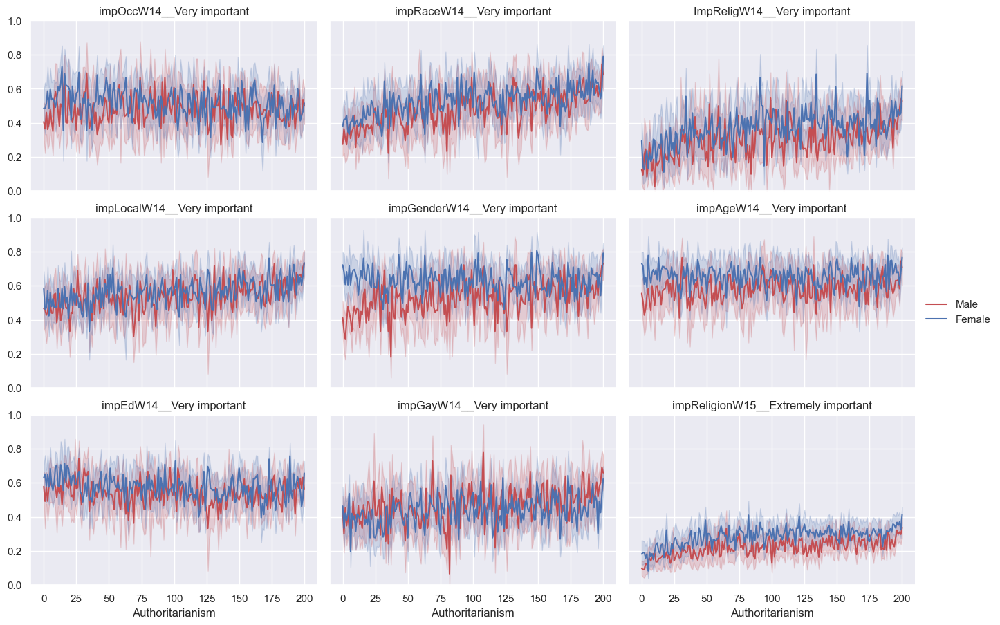

In [81]:
var_list = match(BES_reduced_with_na,"imp[A-Z]").index
plot_vars_against_gender(var_list)

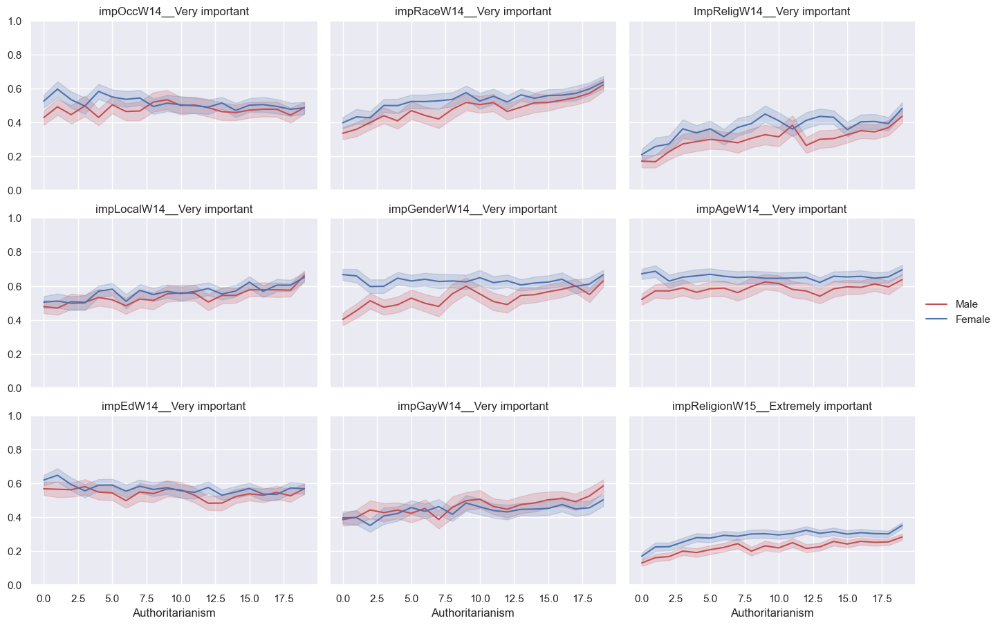

In [101]:
var_list = match(BES_reduced_with_na,"imp[A-Z]").index
plot_vars_against_gender(var_list,al_scale=al_scale_twent)

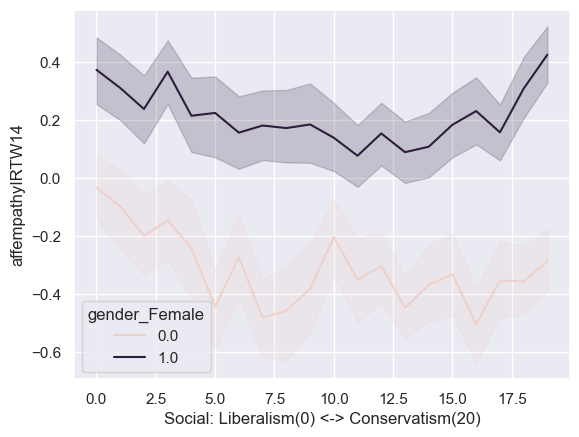

In [141]:
sns.lineplot(y=BES_reduced_with_na["affempathyIRTW14"],x=al_scale_twent,hue=BES_reduced_with_na["gender_Female"])

In [ ]:
# genderdiff_by_q =pd.Series()
# for test_var in ["genderRolesW10__Strongly agree","impGenderW14__Very important","nhsEUW14__Strongly agree","likeGrnW1__Strongly like"]:
#     for q in range(1,100):

#         al_scale_quarts = pd.qcut(al_scale,q).cat.codes.replace(-1,np.nan)
#         genderdiff_by_q.loc[q]=(BES_reduced_with_na[test_var][BES_reduced_with_na["gender_Female"]==1].groupby(al_scale_quarts).mean()
#                                      -BES_reduced_with_na[test_var][BES_reduced_with_na["gender_Female"]==0].groupby(al_scale_quarts).mean()).abs().mean()/BES_reduced_with_na[test_var].max()

#     genderdiff_by_q.plot()
# plt.legend()

In [158]:
def gender_diff(ser,al_scale=al_scale,gender=BES_reduced_with_na["gender_Female"]):
    temp = (ser[gender==1].groupby(al_scale).mean() - ser[gender==0].groupby(al_scale).mean()).abs().mean()
    temp = temp/(ser.max()-ser.min())
#     raise Exception
    return temp

In [194]:
def gender_diff_rel_sd(ser,al_scale=al_scale,gender=BES_reduced_with_na["gender_Female"]):
    mean_diffs = (ser[gender==1].groupby(al_scale).mean() - ser[gender==0].groupby(al_scale).mean()).abs()
    mean_sd = (ser[gender==1].groupby(al_scale).sem() + ser[gender==0].groupby(al_scale).sem())
    temp = (mean_diffs/mean_sd).mean()
#     temp = temp/(ser.max()-ser.min())
#     raise Exception
#     temp=mean_sd
    return temp


In [159]:
BES_reduced_with_na[["affempathyIRTW14"]].apply(gender_diff,al_scale=al_scale_twent)

affempathyIRTW14    0.108343
dtype: float64

In [195]:
BES_reduced_with_na[["affempathyIRTW14"]].apply(gender_diff_rel_sd,al_scale=al_scale_twent)

affempathyIRTW14    4.148268
dtype: float64

In [196]:
%%time
gender_diffs = BES_reduced_with_na.apply(gender_diff,al_scale=al_scale_twent)
gender_diffs.drop("gender_Female",inplace=True)

Wall time: 0 ns


In [197]:
%%time
gender_diffs_rel_sd = BES_reduced_with_na.apply(gender_diff_rel_sd,al_scale=al_scale_twent)
gender_diffs_rel_sd.drop("gender_Female",inplace=True)

Wall time: 0 ns


In [198]:
gender_diffs

turnoutUKGeneralW1__Very likely that I will vote    0.037873
turnoutUKGeneralW2__Very likely that I will vote    0.031834
turnoutUKGeneralW3__Very likely that I will vote    0.035858
turnoutUKGeneralW4__Very likely that I will vote    0.036278
turnoutUKGeneralW5__Very likely that I will vote    0.022008
                                                      ...   
achieveReduceImmigLabW18_Yes                        0.014685
achieveReduceImmigConW18_Yes                        0.035022
partyContactConW3_Yes                               0.055555
partyContact1W3_Yes                                 0.057686
subjectHEW1_W3_Other                                0.035708
Length: 9520, dtype: float64

In [202]:
gender_diffs_rel_sd.sort_values().tail(20)

efficacyUnderstandW7__Strongly agree              6.384935
polAttentionW1__Pay a great deal of attention     6.430106
efficacyNotUnderstandW17__Strongly agree          6.515568
polAttentionW4__Pay a great deal of attention     6.542756
efficacyEUW8__Strongly agree                      6.596494
efficacyUnderstandW8__Strongly agree              6.742557
efficacyUnderstandW4__Strongly agree              6.776826
al4W13__Strongly agree                            6.780960
gayEqualityW6_W14__Gone much too far              6.812817
efficacyUnderstandW1__Strongly agree              6.862598
al4W16__Strongly agree                            7.028985
femaleEqualityW6_W14__Gone much too far           7.049464
al4W10_W12__Strongly agree                        7.058760
al4W14W15__Strongly agree                         7.062329
al4W6__Strongly agree                             7.115121
efficacyUnderstandW16__Strongly agree             7.232994
al4W1_W5__Strongly agree                          7.5250

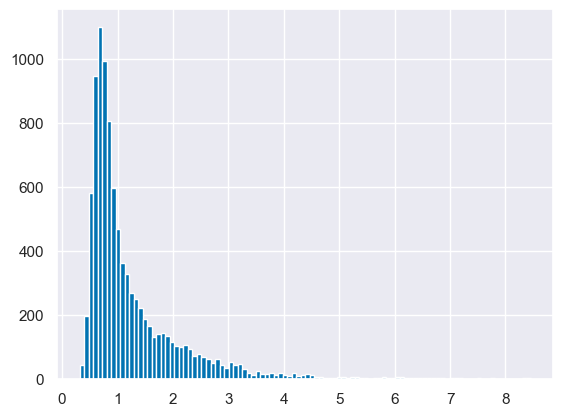

In [201]:
gender_diffs_rel_sd.hist(bins=100)

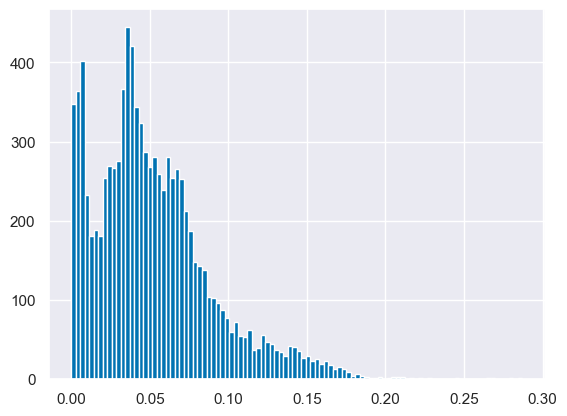

In [125]:
gender_diffs.hist(bins=100)

In [172]:
gender_diffs[gender_diffs>.18].sort_values()

certaintyEULDW8__Very certain                                                     0.181474
partyContactLabW8_Yes                                                             0.182266
scotReferendumVoteW3_I voted 'Yes' (Scotland should be an independent country)    0.182471
scotReferendumIntentionW2_Will vote 'Yes'                                         0.182798
scotElectionVoteListW6_Scottish National Party (SNP)                              0.183085
spendMost4W3_Education                                                            0.183430
scotElectionVoteConstW1_Scottish National Party (SNP)                             0.184365
scotReferendumIntentionW6_Will vote 'Yes'                                         0.184406
relationshipName1W4_Your spouse or partner                                        0.185796
discussantsSameAddress_1W4_Yes                                                    0.186043
partyContactLabW3_Yes                                                             0.188542

In [161]:
BES_reduced_with_na[gender_diffs[gender_diffs>.2].sort_values().index].notnull().sum()

selfOccSuperviseLastW1_Yes                                             11115
cuKnow3W16_False                                                        5556
partySiteConW5_Yes                                                      5564
selfOccSuperviseLastW6_Yes                                             10904
certaintyEULDW7__Very certain                                           5565
selfOccSuperviseLastW19_Yes                                            13557
polKnowAssadW10_President of Syria                                      5056
paperDays_10_2W18_Yes                                                   4805
paperDays_10_1W18_Yes                                                   4805
subjectHEW1_W3_Engineering, Mathematics or Natural sciences            12896
paperDays_10_3W18_Yes                                                   4805
subjectHEW15_Engineering, Mathematics or Natural sciences               6939
subjectHEW1_W3_Humanities, social sciences, psychology or education    12896

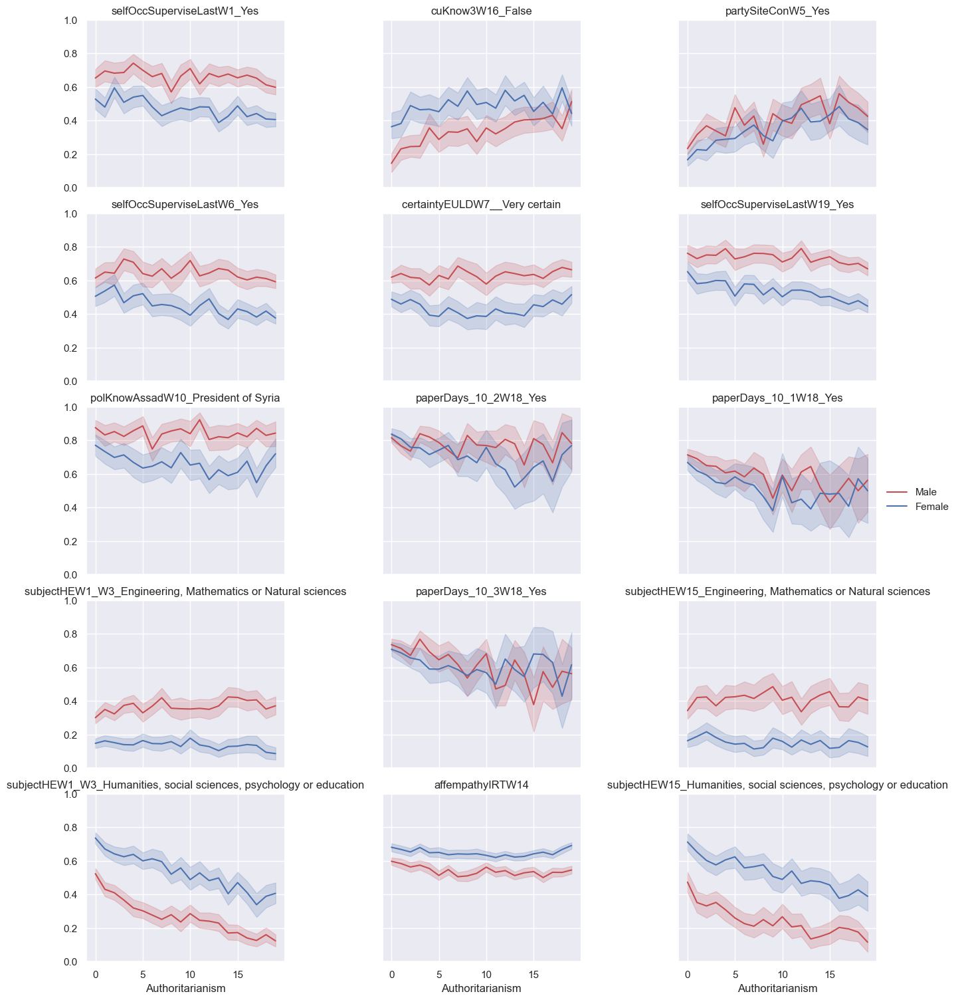

In [151]:
var_list = gender_diffs[gender_diffs>.2].sort_values().index
plot_vars_against_gender(var_list,al_scale=al_scale_twent)

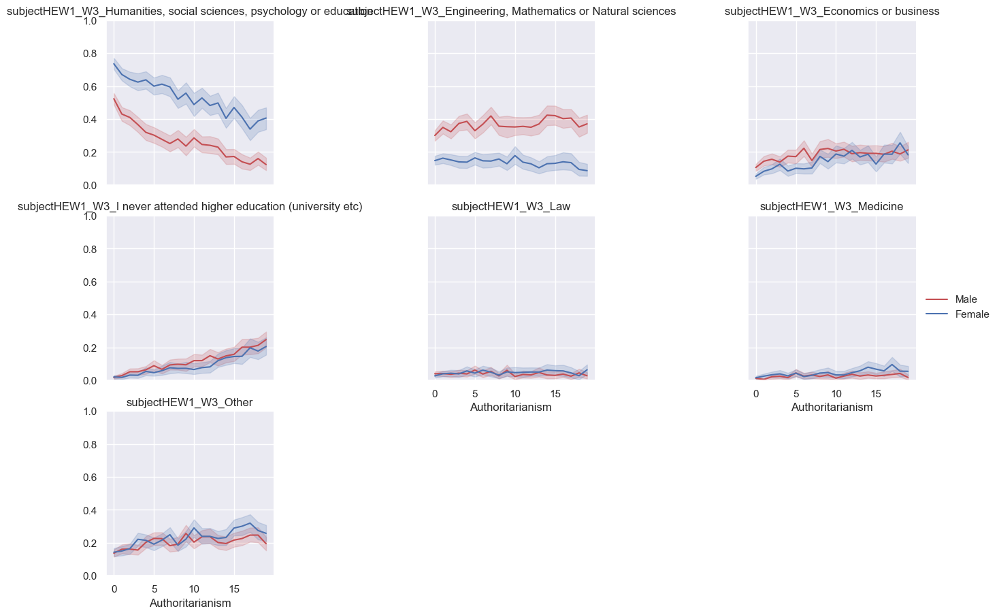

In [169]:
var_list = search(BES_reduced_with_na,"subjectHEW1_W3").index
plot_vars_against_gender(var_list,al_scale=al_scale_twent)

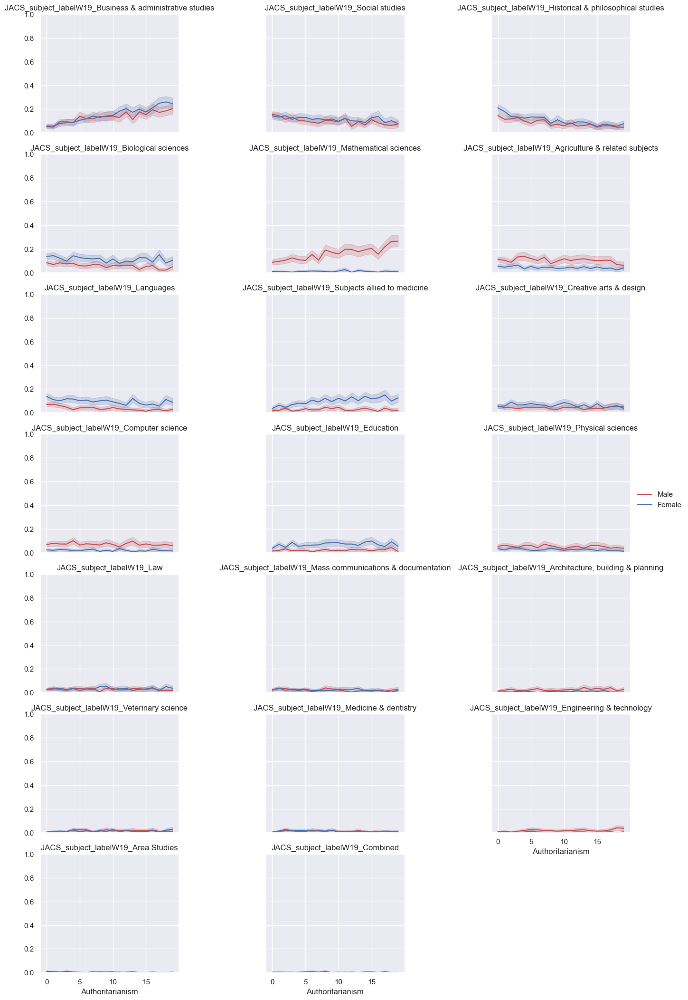

In [210]:
var_list = search(BES_reduced_with_na,"JACS").index
plot_vars_against_gender(var_list,al_scale=al_scale_twent)

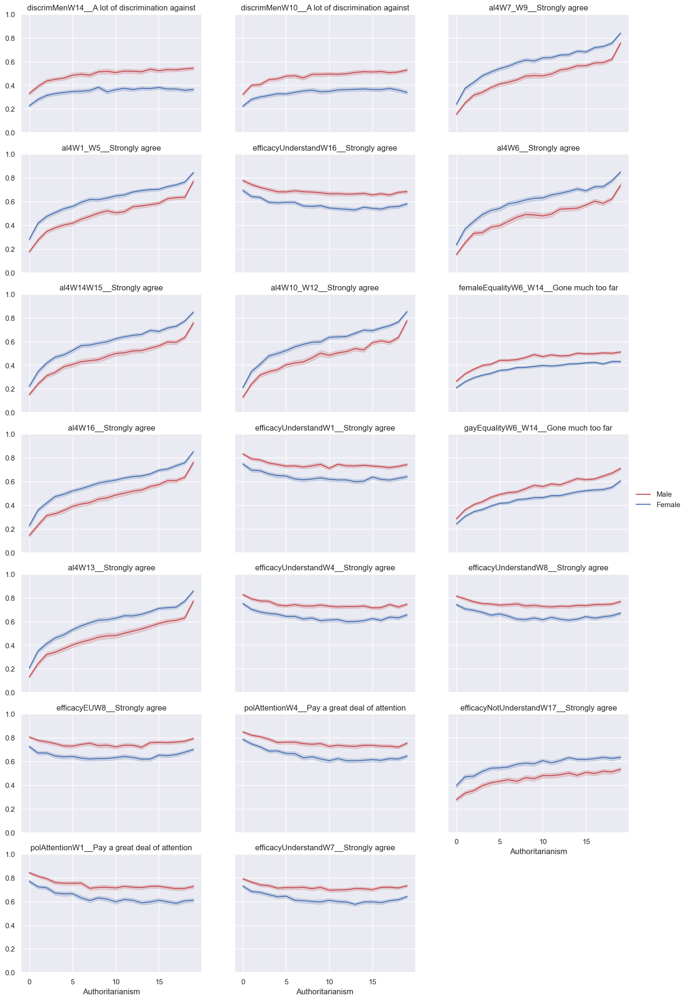

In [205]:
var_list = gender_diffs_rel_sd.sort_values(ascending=False).head(20).index
plot_vars_against_gender(var_list,al_scale=al_scale_twent)
# discrimMen
# al4
# efficacyUnderstand, polAttention, efficacyEU, efficacyNotUnderstand

# skip_string = "discrimMen|al4|efficacyUnderstand|polAttention|efficacyEU|efficacyNotUnderstand"

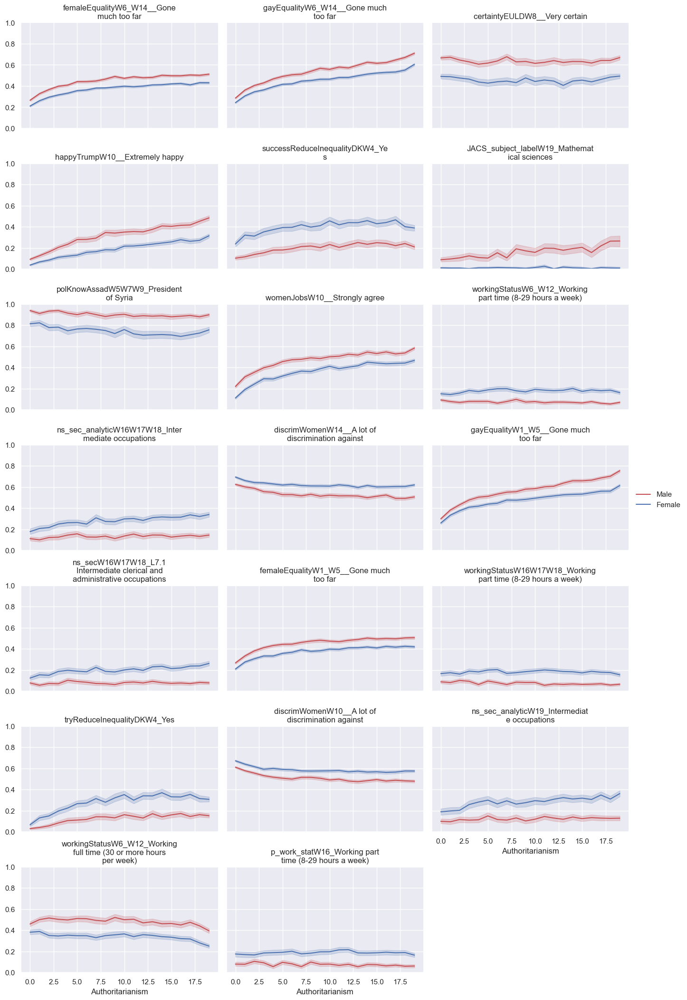

In [221]:
skip_string = "discrimMen|al4|efficacyUnderstand|polAttention|efficacyEU|efficacyNotUnderstand"
var_list = gender_diffs_rel_sd.drop([x for x in gender_diffs_rel_sd.index if re.match(skip_string,x)]).sort_values(ascending=False).head(20).index
plot_vars_against_gender(var_list,al_scale=al_scale_twent)

# femaleEquality,gayEquality,womenJobs,discrimWomen
# certaintyEULD,polKnowAssad,tryReduceInequalityDK, successReduceInequalityDK
# JACS_subject_label,workingStatus,ns_sec_analytic, ns_sec, p_work_status,
    # Maths, part-time/full-time, intermediate occupations, intermediate clerical and administrative occupations

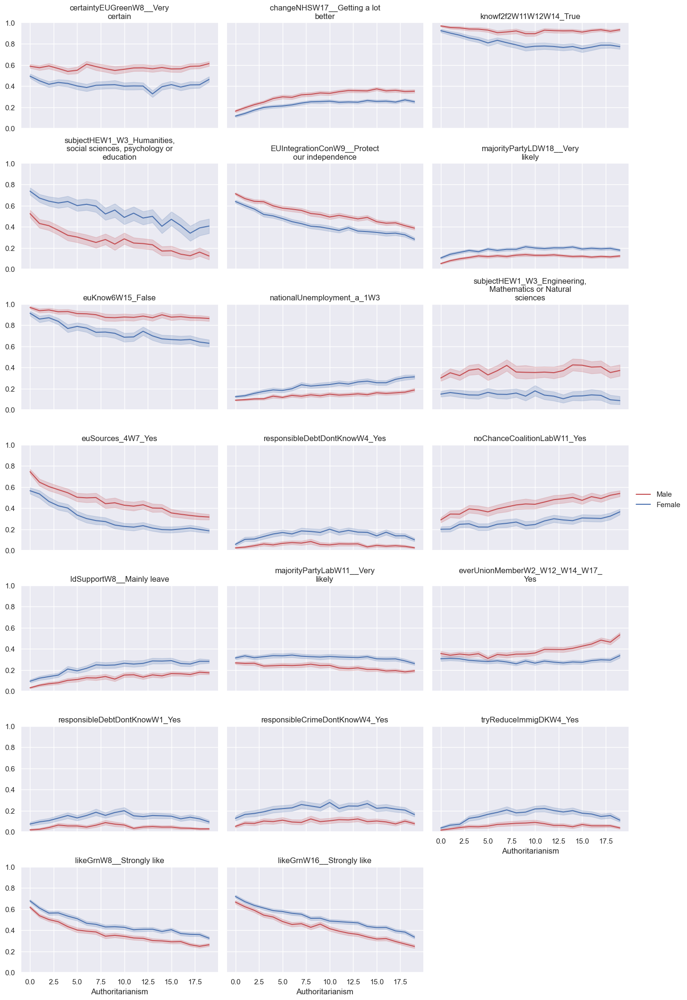

In [223]:
skip_string = "discrimMen|al4|efficacyUnderstand|polAttention|efficacyEU|efficacyNotUnderstand"
skip_string = skip_string+"|femaleEquality|gayEquality|womenJobs|discrimWomen|certaintyEULD|polKnowAssad|tryReduceInequalityDK"
skip_string = skip_string+"|successReduceInequalityDK|JACS_subject_label|workingStatus|ns_sec|p_work_stat|happyTrump"
var_list = gender_diffs_rel_sd.drop([x for x in gender_diffs_rel_sd.index if re.match(skip_string,x)]).sort_values(ascending=False).head(20).index
plot_vars_against_gender(var_list,al_scale=al_scale_twent)

# certaintyEUGreen,ldSupport
# changeNHS
# knowf2f2, euKnow6
# euSources_4
# subjectHE
# majorityPartyLD
# EUIntegrationCon
# nationalUnemployment
# responsibleDebtDontKnow,responsibleCrimeDontKnow,tryReduceImmigDK,
# likeGrn
# noChanceCoalitionLab,majorityPartyLab
# everUnionMember

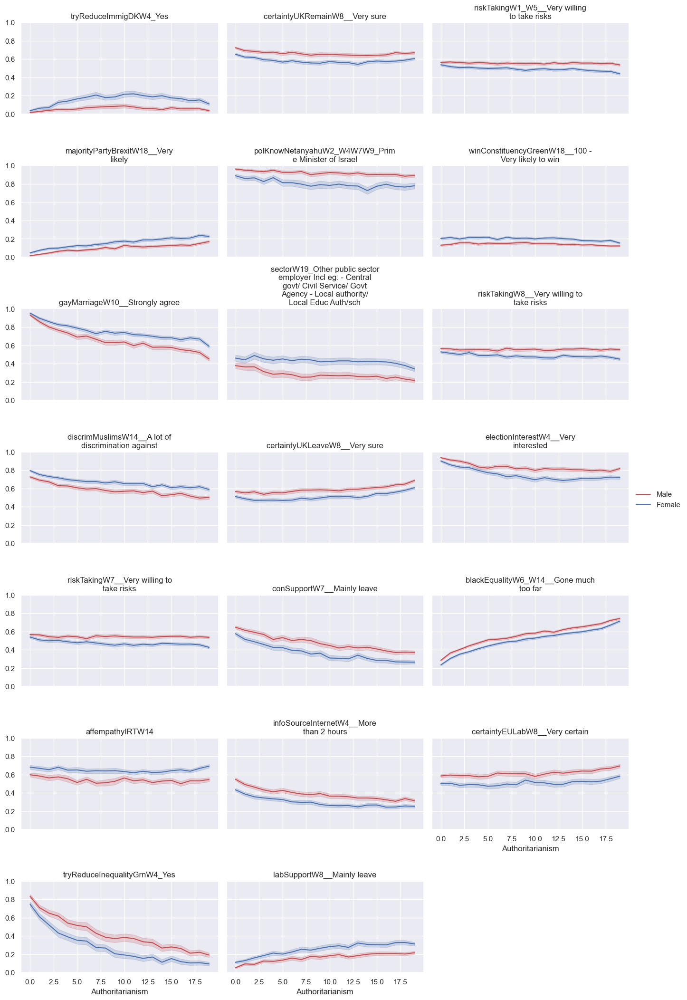

In [225]:
skip_string = "discrimMen|al4|efficacyUnderstand|polAttention|efficacyEU|efficacyNotUnderstand"
skip_string = skip_string+"|femaleEquality|gayEquality|womenJobs|discrimWomen|certaintyEULD|polKnowAssad|tryReduceInequalityDK"
skip_string = skip_string+"|successReduceInequalityDK|JACS_subject_label|workingStatus|ns_sec|p_work_stat|happyTrump"

skip_string = skip_string+"|certaintyEUGreen|ldSupport|changeNHS|knowf2f|euKnow|euSources|subjectHE"
skip_string = skip_string+"|majorityPartyLD|EUIntegrationCon|nationalUnemployment|DontKnow|likeGrn|noChanceCoalitionLab"
skip_string = skip_string+"|noChanceCoalitionLab|majorityPartyLab|everUnionMember"


# certaintyEUGreen,ldSupport
# changeNHS
# knowf2f2, euKnow6
# euSources_4
# subjectHE
# majorityPartyLD
# EUIntegrationCon
# nationalUnemployment
# responsibleDebtDontKnow,responsibleCrimeDontKnow,tryReduceImmigDK,
# likeGrn
# noChanceCoalitionLab,majorityPartyLab
# everUnionMember

var_list = gender_diffs_rel_sd.drop([x for x in gender_diffs_rel_sd.index if re.search(skip_string,x)]).sort_values(ascending=False).head(20).index
plot_vars_against_gender(var_list,al_scale=al_scale_twent)

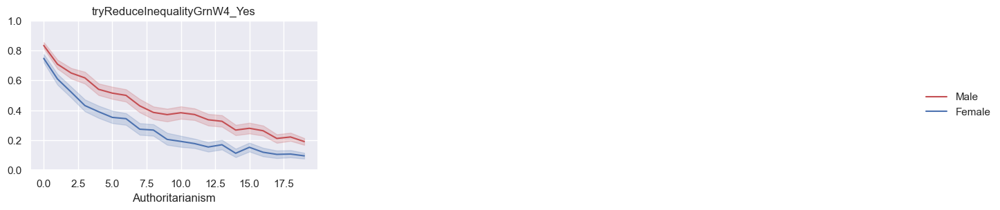

In [228]:
var_list = ["tryReduceInequalityGrnW4_Yes"]
plot_vars_against_gender(var_list,al_scale=al_scale_twent)

In [ ]:
## like/ptv UKIP/BXP/BNP x Auth x Gender x Wave

## Motivation: UKIP - and maybe perceptions thereof - change quite a bit 2014-2023
# Can't help but wonder if that has different impacts by gender x auth

In [237]:
search(BES_reduced_with_na,"ptvUKIP").index

Index(['ptvUKIPW1__Very likely', 'ptvUKIPW2__Very likely',
       'ptvUKIPW3__Very likely', 'ptvUKIPW4__Very likely',
       'ptvUKIPW5__Very likely', 'ptvUKIPW6__Very likely',
       'ptvUKIPW7__Very likely', 'ptvUKIPW8__Very likely',
       'ptvUKIPW9__Very likely', 'ptvUKIPW10__Very likely',
       'ptvUKIPW11__Very likely', 'ptvUKIPW12__Very likely',
       'ptvUKIPW13__Very likely', 'ptvUKIPExpW14__Very likely',
       'ptvUKIPW15__Very likely', 'ptvUKIPW16__Very likely',
       'ptvUKIPW17__Very likely', 'ptvUKIPW18__Very likely'],
      dtype='object')

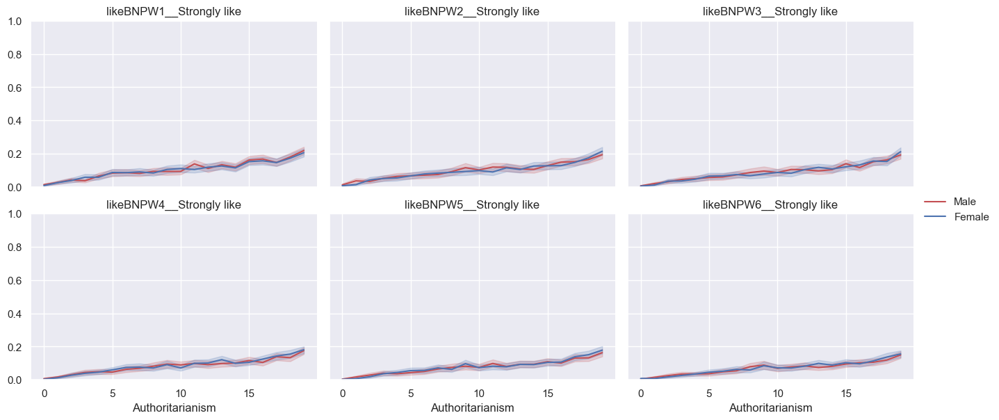

In [230]:
var_list = search(BES_reduced_with_na,"likeBNP").index
plot_vars_against_gender(var_list,al_scale=al_scale_twent)

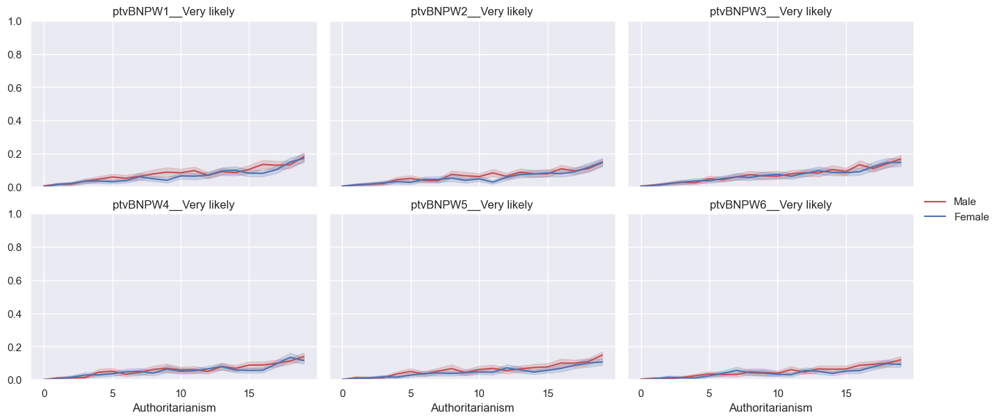

In [233]:
var_list = search(BES_reduced_with_na,"ptvBNP").index
plot_vars_against_gender(var_list,al_scale=al_scale_twent)

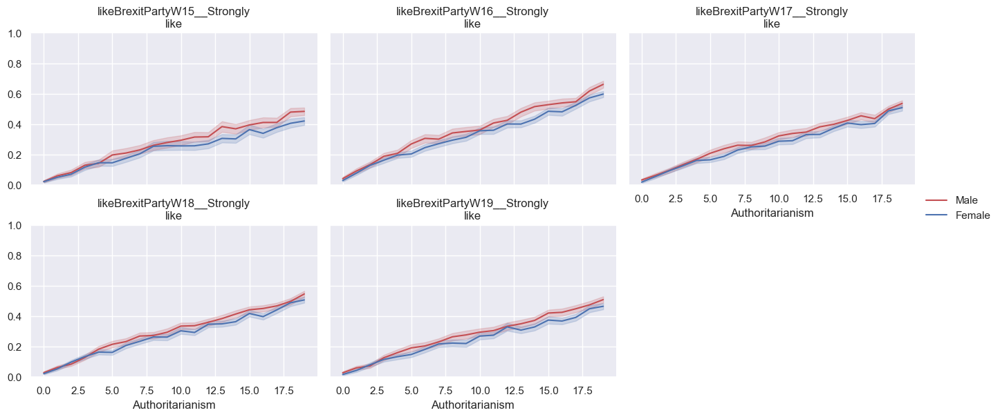

In [235]:
var_list = search(BES_reduced_with_na,"likeBrexit").index
plot_vars_against_gender(var_list,al_scale=al_scale_twent)

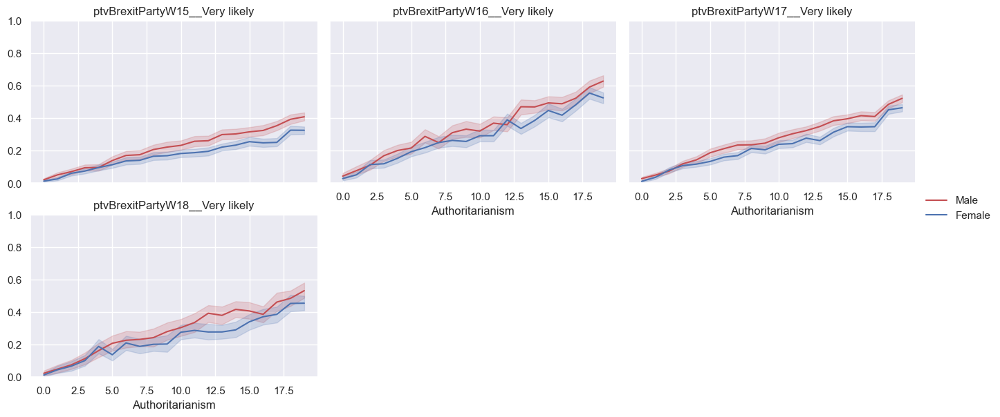

In [236]:
var_list = search(BES_reduced_with_na,"ptvBrexit").index
plot_vars_against_gender(var_list,al_scale=al_scale_twent)

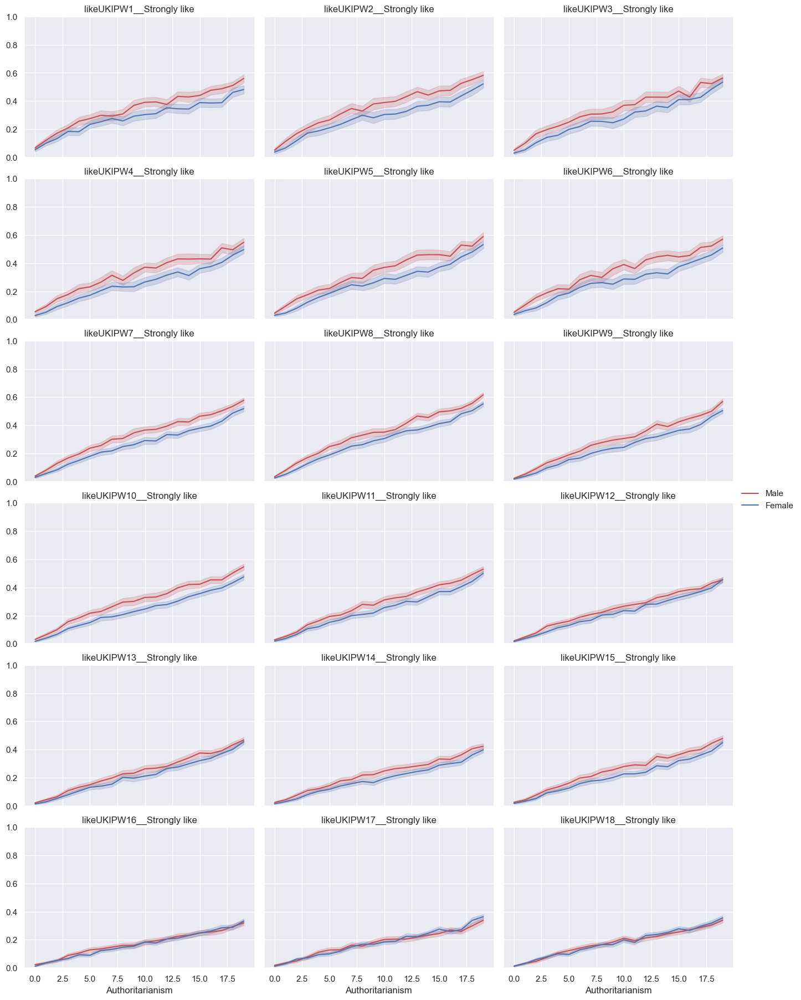

In [238]:
var_list = search(BES_reduced_with_na,"likeUKIP").index
plot_vars_against_gender(var_list,al_scale=al_scale_twent)

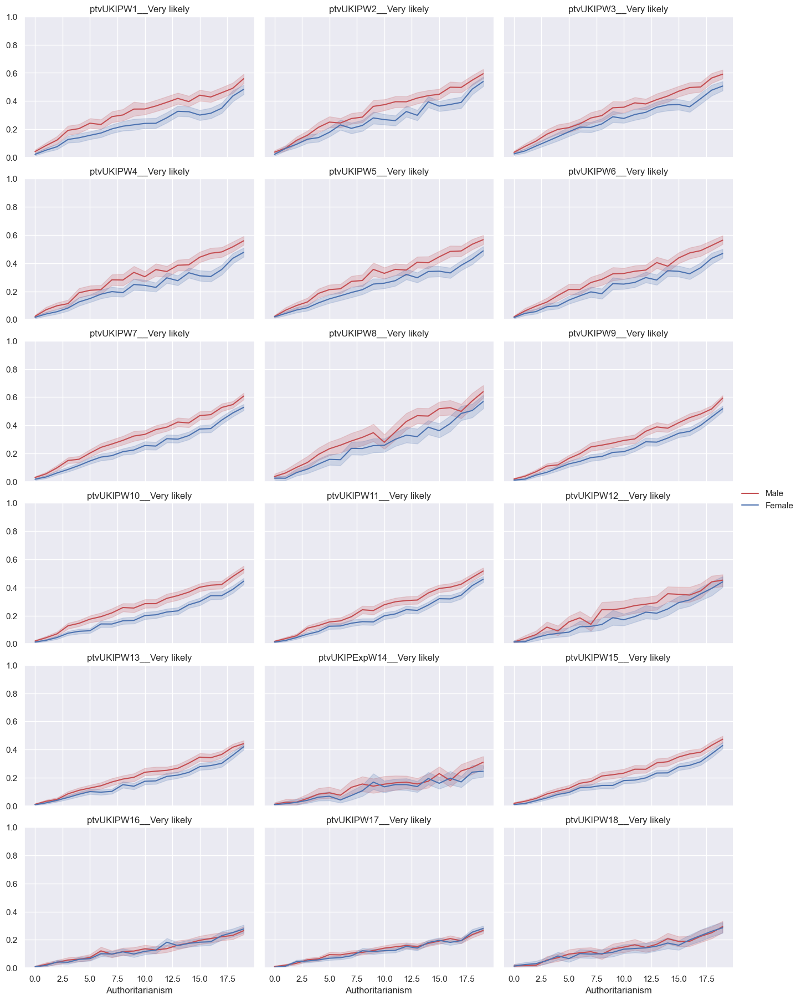

In [239]:
var_list = search(BES_reduced_with_na,"ptvUKIPW").index
plot_vars_against_gender(var_list,al_scale=al_scale_twent)

In [ ]:
## similar pattern with ptv/like
## gender gap only opens up when popularity rises above a certain level (BNP/late UKIP too low)

In [168]:
BES_reduced_with_na["subjectHEW1_W3_Other"]=BES_Panel["subjectHEW1_W3"]=="Other"
BES_reduced_with_na.loc[BES_Panel["subjectHEW1_W3"].isnull(),"subjectHEW1_W3_Other"]=np.nan

In [35]:
df = pd.read_stata( "E:\\Users\\Gamer\\Documents\\GitHub\\BES_analysis\\BES_analysis_data\\W23_only\\BES2019_W23_v23.0.dta" )

In [6]:
search(df,"likeJohnson|al_scale|gender")

likeJohnson    30949
al_scale       26399
gender         30941
dtype: int64

In [25]:
gender = df["gender"]
likeJohnson = df["likeJohnson"].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)/10
authoritarian = df["al_scale"].cat.codes.replace(-1,np.nan)/20
# likeFarage = df["likeFarage"].replace("Don't know",np.nan).cat.codes.replace(-1,np.nan)/10

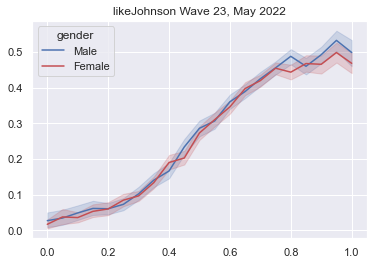

In [22]:
sns.lineplot(x=authoritarian,y=likeJohnson,hue=gender,palette={"Male":'b',"Female":'r'});
plt.title("likeJohnson Wave 23, May 2022");

In [24]:
search(df,"Farage")

Series([], dtype: float64)

In [16]:
likeJohnson.max()

10.0

In [9]:
gender.value_counts(dropna=False)

Female    17275
Male      13666
NaN           8
Name: gender, dtype: int64

In [12]:
authoritarian.value_counts(dropna=False)

NaN              4550
7.5              2434
7.0              2285
6.5              2123
8.0              1920
6.0              1878
5.0              1781
8.5              1745
5.5              1689
9.0              1458
4.5              1326
4.0              1163
9.5              1128
3.5              1029
Authoritarian     971
3.0               908
2.5               719
2.0               586
1.5               447
1.0               343
Libertarian       237
0.5               229
Name: al_scale, dtype: int64

In [13]:
likeJohnson

0                       7
1                       1
2        Strongly dislike
3                       6
4                       7
               ...       
30944                   5
30945                   2
30946                   2
30947                   7
30948                   6
Name: likeJohnson, Length: 30949, dtype: category
Categories (11, object): ['Strongly dislike' < '1' < '2' < '3' ... '7' < '8' < '9' < 'Strongly like']

In [64]:
BES_Panel["sector"].value_counts(dropna=False)

Private sector firm of company Including, for example, limited companies and PLCs                                          13680
Other public sector employer Incl eg: - Central govt/ Civil Service/ Govt Agency - Local authority/ Local Educ Auth/sch     9581
Self-employed                                                                                                               2077
Charity/voluntary sector Including, for example, charitable companies, churches, trade unions:                              1686
NaN                                                                                                                         1635
Don't know                                                                                                                  1211
Other                                                                                                                        639
Nationalised industry or public corporation *Including, for example, the Post Office and the BBC 

In [66]:
BES_Panel["p_job_sector"].value_counts(dropna=False)

Not applicable                                                                                          13718
Private sector â profit-seeking (e.g. public limited company, partnership)                             9253
Public sector â government owned or funded (e.g. civil service, local government, NHS, university)     5345
Third sector â non-profit, non-governmental (e.g. charity, social enterprise)                          1347
NaN                                                                                                      1231
Don't know                                                                                                574
Name: p_job_sector, dtype: int64

In [68]:
BES_Panel["p_job_sector"][BES_Panel["sector"]=="Private sector firm of company Including, for example, limited companies and PLCs"].value_counts()

Private sector â profit-seeking (e.g. public limited company, partnership)                            7351
Not applicable                                                                                          5327
Public sector â government owned or funded (e.g. civil service, local government, NHS, university)     238
Don't know                                                                                               132
Third sector â non-profit, non-governmental (e.g. charity, social enterprise)                          130
Name: p_job_sector, dtype: int64

In [67]:
BES_Panel["sector"].groupby(BES_Panel["p_job_sector"]).value_counts()

p_job_sector                                                                                          sector                                                                                                                 
Private sector â profit-seeking (e.g. public limited company, partnership)                          Private sector firm of company Including, for example, limited companies and PLCs                                          7351
                                                                                                      Self-employed                                                                                                               871
                                                                                                      Other public sector employer Incl eg: - Central govt/ Civil Service/ Govt Agency - Local authority/ Local Educ Auth/sch     286
                                                                                        

In [61]:
search(BES_reduced_with_na,"sector")

sector_Private sector firm of company Including, for example, limited companies and PLCs                                                  27983
sector_Other public sector employer Incl eg: - Central govt/ Civil Service/ Govt Agency - Local authority/ Local Educ Auth/sch            27983
sector_Self-employed                                                                                                                      27983
sector_Charity/voluntary sector Including, for example, charitable companies, churches, trade unions:                                     27983
sector_Nationalised industry or public corporation *Including, for example, the Post Office and the BBC                                   27983
sector_Own your own business / company                                                                                                    27983
sectorPartner_Private sector firm of company *Including, for example, limited companies and PLCs*                                       

In [358]:
## are any of these surprising?

# deficit_reduce (female -> necessary)
# privateenterprise -> matches male/female divide!
# taxSpend_self, redistSelf
# populism1


# maybe acquiescence, bias towards midpoint?
# strongLeader, satDemUK

# progression of p_vote_Conservative 2010/15/17/19 is cool
# ditto leftRight_self

0.0

In [ ]:
# get rid of variable=

In [ ]:
# age, resourceAccess1_2_Yes, resourceAccess3_5_Yes, edlevelPartner__Postgrad, 

# avoid things which might historical demographic 'overhangs'

# however, the education variables are prob more recent - 
# bears separate investigation!

# anyUni__Yes, I graduated from higher education
#  'p_edlevelUni__Postgrad',
#  'p_edlevel__Postgrad',
#  'p_education_age__Still at school/Full time student',

In [323]:
gender_gap.sort_values()

selfOccSuperviseLast_Yes                                                                                                                 -0.181702
p_job_sector_Private sector profit-seeking (e.g. public limited company, partnership)                                                    -0.179007
sectorPartner_Other public sector employer *Incl eg: - Central govt/ Civil Service/ Govt Agency - Local authority/ Local Educ Auth/sch   -0.149172
sector_Private sector firm of company Including, for example, limited companies and PLCs                                                 -0.147856
p_work_stat_Working full time (30 or more hours per week)                                                                                -0.128895
                                                                                                                                            ...   
ns_sec_L7.1 Intermediate clerical and administrative occupations                                                      

In [307]:
# gender_gap_corr = 
# BES_reduced_with_na.astype('float').T.corrwith(gender_gap)
#.corr(gender_gap)

# correlate gender gap with individuals???

In [308]:
gender_gap

turnoutUKGeneral__Very likely that I will vote   -0.023054
partyIdStrength__Not very strong                  0.035608
polAttention__Pay a great deal of attention      -0.084313
pidWeThey__Strongly agree                        -0.052842
pidInterestedOthers__Strongly agree              -0.002155
                                                    ...   
responsibleEconC_2_Yes                           -0.004656
responsibleEconC_1_Yes                           -0.065377
coronaMeasures_2_Yes                              0.044327
coronaMeasures_1_Yes                             -0.002246
coronaMeasures_4_Yes                              0.018628
Length: 742, dtype: float64

In [241]:
corrs

turnoutUKGeneral__Very likely that I will vote   -0.109445
partyIdStrength__Not very strong                  0.006971
polAttention__Pay a great deal of attention      -0.220401
pidWeThey__Strongly agree                         0.026360
pidInterestedOthers__Strongly agree              -0.164948
                                                    ...   
responsibleEconC_2_Yes                            0.046046
responsibleEconC_1_Yes                           -0.270511
coronaMeasures_2_Yes                             -0.043433
coronaMeasures_1_Yes                             -0.032824
coronaMeasures_4_Yes                              0.040251
Length: 742, dtype: float64

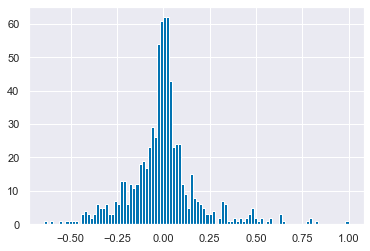

In [249]:
corrs.hist(bins=100)

In [258]:
corrs[corrs.abs()>.5].sort_values().tail(10)

dealPriorityRedTape__Extremely important    0.582385
al4__Strongly agree                         0.628310
immigrantsWelfareState__Strongly agree      0.634510
govtHandouts__Strongly agree                0.635757
dealPriorityImmig__Extremely important      0.640230
al3__Strongly agree                         0.783903
al2__Strongly agree                         0.790263
al5__Strongly agree                         0.800879
al1__Strongly agree                         0.819360
al_scale__Authoritarian                     1.000000
dtype: float64

['likeJohnson__Strongly like',
 'likeStarmer__Strongly like',
 'likeDavey__Strongly like',
 'likeSturgeon__Strongly like',
 'likeFarage__Strongly like',
 'likeBartley__Strongly like',
 'likeBerry__Strongly like',
 'likeCon__Strongly like',
 'likeLab__Strongly like',
 'likeLD__Strongly like',
 'likeSNP__Strongly like',
 'likePC__Strongly like',
 'likeBrexitParty__Strongly like',
 'likeGrn__Strongly like',
 'EUIntegrationSelf__Protect our independence',
 'immigEcon__Good for economy',
 'immigCultural__Enriches cultural life',
 'euPriorityBalance__Control immigration',
 'handleCorona__Very well',
 'handleCoronaLab__Very well',
 'govtHandlelockdown__Very well',
 'govtHandlePPE__Very well',
 'govtHandleTesting__Very well',
 'changeNHS__Getting a lot better',
 'changeEconomyLab__Getting a lot better',
 'changeNHSLab__Getting a lot better',
 'ptvCon__Very likely',
 'ptvLab__Very likely',
 'ptvLD__Very likely',
 'ptvSNP__Very likely',
 'ptvPC__Very likely',
 'ptvBrexitParty__Very likely',
 'pt

In [260]:
high_correlation_corrs

['likeJohnson__Strongly like',
 'likeStarmer__Strongly like',
 'likeDavey__Strongly like',
 'likeSturgeon__Strongly like',
 'likeFarage__Strongly like',
 'likeBartley__Strongly like',
 'likeBerry__Strongly like',
 'likeCon__Strongly like',
 'likeLab__Strongly like',
 'likeLD__Strongly like',
 'likeSNP__Strongly like',
 'likePC__Strongly like',
 'likeBrexitParty__Strongly like',
 'likeGrn__Strongly like',
 'EUIntegrationSelf__Protect our independence',
 'immigEcon__Good for economy',
 'immigCultural__Enriches cultural life',
 'euPriorityBalance__Control immigration',
 'handleCorona__Very well',
 'handleCoronaLab__Very well',
 'govtHandlelockdown__Very well',
 'govtHandlePPE__Very well',
 'govtHandleTesting__Very well',
 'changeNHS__Getting a lot better',
 'changeEconomyLab__Getting a lot better',
 'changeNHSLab__Getting a lot better',
 'ptvCon__Very likely',
 'ptvLab__Very likely',
 'ptvLD__Very likely',
 'ptvSNP__Very likely',
 'ptvPC__Very likely',
 'ptvBrexitParty__Very likely',
 'pt

In [282]:
gender_gap.sort_values()

benchCoronaKorea__Very good                   -5.706173
age                                           -2.889029
benchCoronaGermany__Very good                 -1.276736
benchCoronaUSA__Very good                     -1.055726
polAttention__Pay a great deal of attention   -0.843130
                                                 ...   
gender_Female                                  1.000000
likeSturgeon__Strongly like                    1.080234
benchCoronaUK__Very good                       2.648001
benchCoronaSweden__Very good                   3.864810
benchCoronaItaly__Very good                    4.376520
Length: 742, dtype: float64

In [293]:
gender_gap.drop('gender_Female')

turnoutUKGeneral__Very likely that I will vote   -0.023054
partyIdStrength__Not very strong                  0.035608
polAttention__Pay a great deal of attention      -0.084313
pidWeThey__Strongly agree                        -0.052842
pidInterestedOthers__Strongly agree              -0.002155
                                                    ...   
responsibleEconC_2_Yes                           -0.004656
responsibleEconC_1_Yes                           -0.065377
coronaMeasures_2_Yes                              0.044327
coronaMeasures_1_Yes                             -0.002246
coronaMeasures_4_Yes                              0.018628
Length: 741, dtype: float64

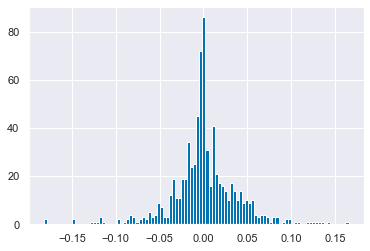

In [294]:
gender_gap.drop('gender_Female').hist(bins=100)

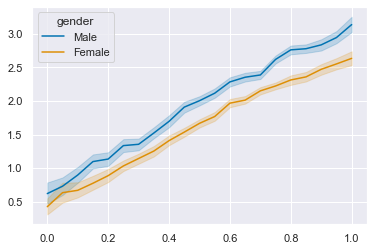

In [47]:
sns.lineplot(x=authoritarianism, y=gayEquality, hue=df["gender"])

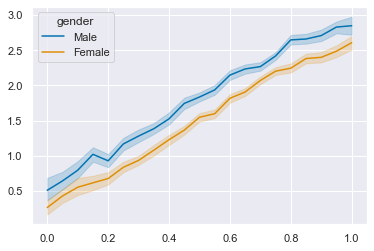

In [56]:
sns.lineplot(x=authoritarianism, y=blackEquality, hue=df["gender"])

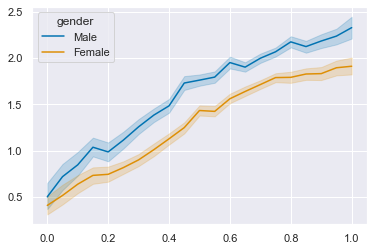

In [57]:
sns.lineplot(x=authoritarianism, y=femaleEquality, hue=df["gender"])

In [54]:

search(df,"Equality")

scotIndepInequalityW1         5896
inequalityChangeW2           30260
inequalityChangeLargerW2     23229
inequalityChangeSmallerW2     1444
inequalityGoodBadW2          30262
                             ...  
femaleEqualityW1_W5          41876
gayEqualityW1_W5             41876
blackEqualityW6_W14          63222
femaleEqualityW6_W14         63748
gayEqualityW6_W14            63222
Length: 62, dtype: int64

In [ ]:
### how about other minorities?

In [49]:
search(df,"embes|p_")

partyContactUKIP_1W1      235
partyContactUKIP_2W1      235
partyContactUKIP_3W1      235
partyContactUKIP_4W1      235
partyContactUKIP_5W1      235
                        ...  
p_edlevelUniW21         28158
p_edlevelUniW8          29010
p_edlevelUniW17         31102
p_edlevelUniW18         23054
p_eurefturnout          91315
Length: 700, dtype: int64

In [51]:
df["p_sexualityW23"].value_counts()

Heterosexual         27207
Prefer not to say     1137
Gay or lesbian        1094
Bisexual              1084
Other                  371
Name: p_sexualityW23, dtype: int64

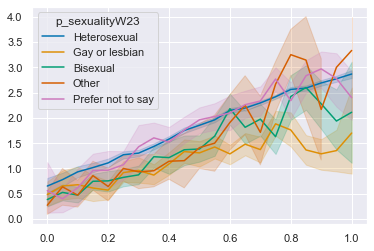

In [52]:
sns.lineplot(x=authoritarianism, y=gayEquality, hue=df["p_sexualityW23"])

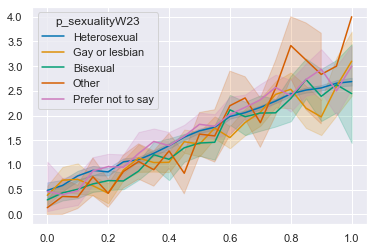

In [58]:
sns.lineplot(x=authoritarianism, y=blackEquality, hue=df["p_sexualityW23"])

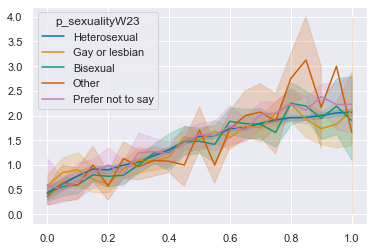

In [59]:
sns.lineplot(x=authoritarianism, y=femaleEquality, hue=df["p_sexualityW23"])

In [73]:
het_or_not = df["p_sexualityW23"]=="Heterosexual"
het_or_not[df["p_sexualityW23"].isnull()]=np.nan
het_or_not.value_counts(dropna=False)

NaN    76903
1.0    27207
0.0     3686
Name: p_sexualityW23, dtype: int64

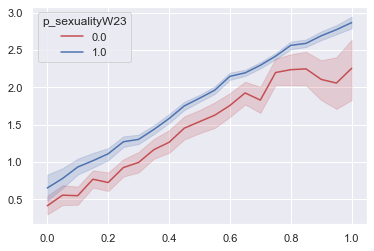

In [76]:
sns.lineplot(x=authoritarianism, y=gayEquality, hue=het_or_not,palette={0:'r',1:'b'})

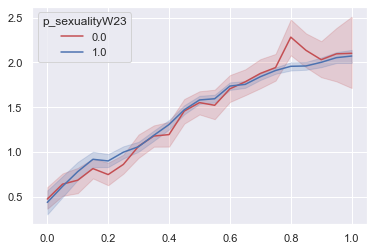

In [77]:
sns.lineplot(x=authoritarianism, y=femaleEquality, hue=het_or_not,palette={0:'r',1:'b'})

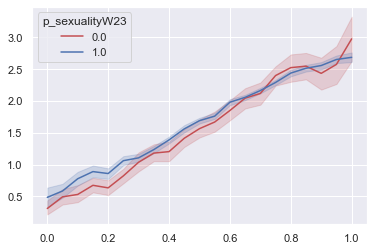

In [78]:
sns.lineplot(x=authoritarianism, y=blackEquality, hue=het_or_not,palette={0:'r',1:'b'})

In [81]:
df["p_religionW23"].value_counts()

def get_rel_minority(x):
    if x =="No, I do not regard myself as belonging to any particular religion.":
        return "Nonreligious"
    elif x =="Yes - Church of England/Anglican/Episcopal":
        return "CofE"
    elif x =="Yes - Roman Catholic":
        return "Catholic"
    elif x =="Prefer not to say":
        return "Prefer not to say"    
    elif pd.isnull(x):
        return np.nan
    else:
        return "Rel Minority"
    
df["p_religionW23"].apply(get_rel_minority).value_counts()

Nonreligious         15851
CofE                  7769
Rel Minority          4127
Catholic              2139
Prefer not to say      807
Name: p_religionW23, dtype: int64

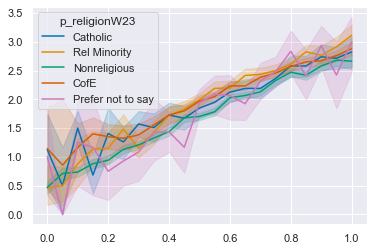

In [82]:
sns.lineplot(x=authoritarianism, y=gayEquality, hue=df["p_religionW23"].apply(get_rel_minority))

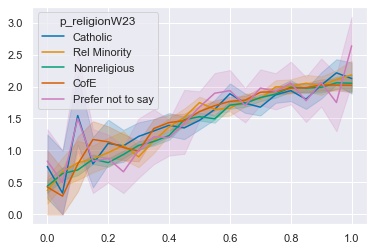

In [83]:
sns.lineplot(x=authoritarianism, y=femaleEquality, hue=df["p_religionW23"].apply(get_rel_minority))

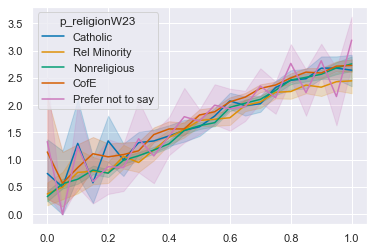

In [84]:
sns.lineplot(x=authoritarianism, y=blackEquality, hue=df["p_religionW23"].apply(get_rel_minority))

In [87]:
df["p_ethnicityW23"].value_counts()

whiteBrit_or_not = df["p_ethnicityW23"]=="White British"
whiteBrit_or_not[df["p_ethnicityW23"].isnull()]=np.nan
whiteBrit_or_not.value_counts(dropna=False)

NaN    78397
1.0    26243
0.0     3156
Name: p_ethnicityW23, dtype: int64

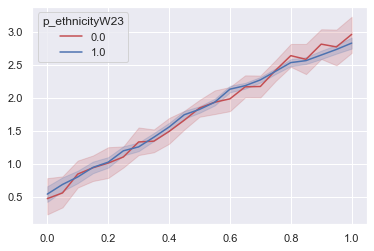

In [91]:
sns.lineplot(x=authoritarianism, y=gayEquality, hue=whiteBrit_or_not,palette={0:'r',1:'b'})

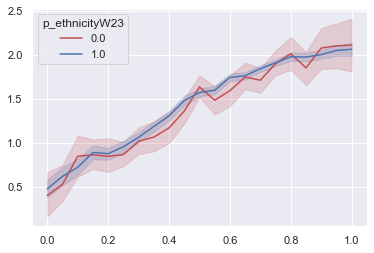

In [92]:
sns.lineplot(x=authoritarianism, y=femaleEquality, hue=whiteBrit_or_not,palette={0:'r',1:'b'})

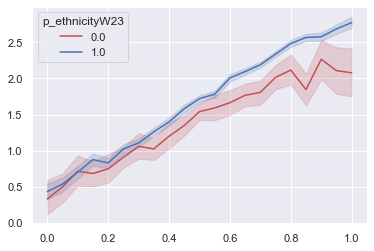

In [93]:
sns.lineplot(x=authoritarianism, y=blackEquality, hue=whiteBrit_or_not,palette={0:'r',1:'b'})

In [94]:
## p_parent, p_disability

In [96]:
df["p_parentW23"].value_counts()

Yes    17808
No     11743
Name: p_parentW23, dtype: int64

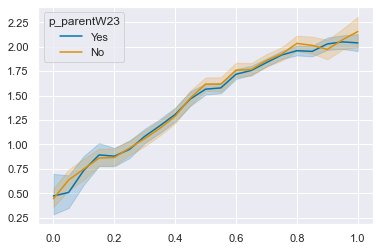

In [97]:
sns.lineplot(x=authoritarianism, y=femaleEquality, hue=df["p_parentW23"])

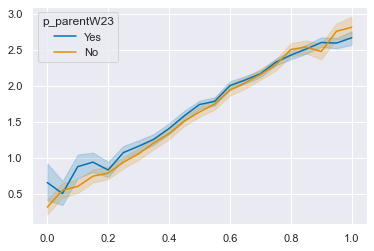

In [98]:
sns.lineplot(x=authoritarianism, y=blackEquality, hue=df["p_parentW23"])

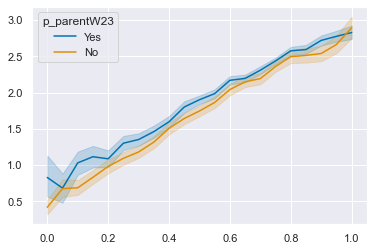

In [99]:
sns.lineplot(x=authoritarianism, y=gayEquality, hue=df["p_parentW23"])

In [106]:
femaleEquality.notnull().sum(),gayEquality.notnull().sum(),blackEquality.notnull().sum()

(28589, 27432, 27659)

In [108]:
df["p_disabilityW23"].value_counts()

No                       21440
Yes, limited a little     5917
Yes, limited a lot        3208
Name: p_disabilityW23, dtype: int64

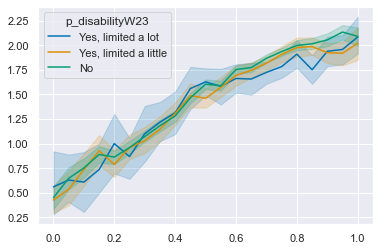

In [109]:
sns.lineplot(x=authoritarianism, y=femaleEquality, hue=df["p_disabilityW23"])

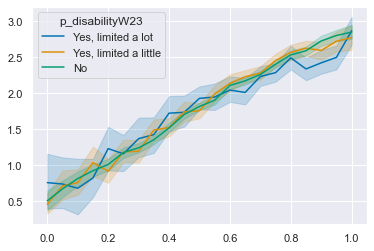

In [110]:
sns.lineplot(x=authoritarianism, y=gayEquality, hue=df["p_disabilityW23"])

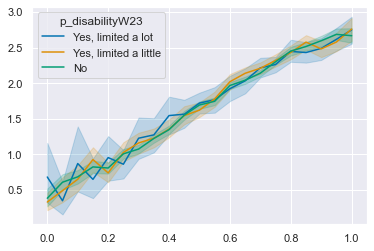

In [111]:
sns.lineplot(x=authoritarianism, y=blackEquality, hue=df["p_disabilityW23"])

In [113]:
not_disabled_at_all = df["p_disabilityW23"]=="No"
not_disabled_at_all[  df["p_disabilityW23"].isnull() ]=np.nan
not_disabled_at_all.value_counts(dropna=False)

NaN    77231
1.0    21440
0.0     9125
Name: p_disabilityW23, dtype: int64

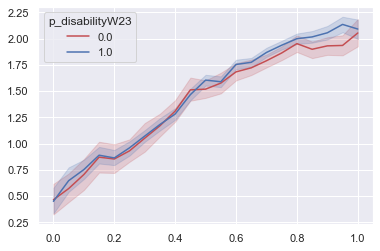

In [114]:
sns.lineplot(x=authoritarianism, y=femaleEquality, hue=not_disabled_at_all,palette={0:'r',1:'b'})

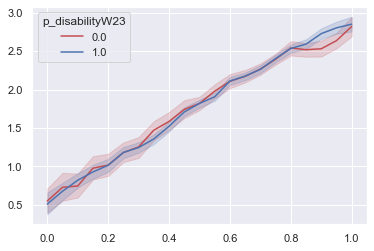

In [115]:
sns.lineplot(x=authoritarianism, y=gayEquality, hue=not_disabled_at_all,palette={0:'r',1:'b'})

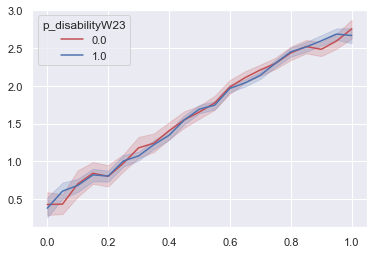

In [116]:
sns.lineplot(x=authoritarianism, y=blackEquality, hue=not_disabled_at_all,palette={0:'r',1:'b'})

In [372]:
search(BES_reduced_with_na,"Farage|al2")

likeFarage__Strongly like    29778
al2__Strongly agree          29498
dtype: int64

In [374]:
BES_reduced_with_na["likeFarage__Strongly like"].groupby(BES_reduced_with_na["al2__Strongly agree"]).mean()

al2__Strongly agree
0.0    0.961051
1.0    1.979009
2.0    3.049005
3.0    3.688448
4.0    4.719222
Name: likeFarage__Strongly like, dtype: float32

In [376]:
BES_reduced_with_na["al2__Strongly agree"].value_counts(normalize=True).sort_index()

0.0    0.271171
1.0    0.148552
2.0    0.119364
3.0    0.230049
4.0    0.230863
Name: al2__Strongly agree, dtype: float64

In [54]:
### do we have enough data to see change in al_values over time?
search(BES_reduced_with_na,"al1")

al1W6__Strongly agree                                                                           29014
al1W13__Strongly agree                                                                          29463
sdoantiegal1W15__Strongly favour                                                                 6146
al1W16__Strongly agree                                                                          35590
al1W17__Strongly agree                                                                          32277
al1W1_W5__Strongly agree                                                                        40147
al1W14W15__Strongly agree                                                                       34158
al1W7_W9__Strongly agree                                                                        37943
al1W10_W12__Strongly agree                                                                      32606
incremental1W19_Established traditions provide the wisdom necessary to understand 

In [55]:
search(BES_reduced_with_na,"al_scale")

al_scaleW1_W5__Authoritarian      37890
al_scaleW6__Authoritarian         27288
al_scaleW7_W9__Authoritarian      35873
al_scaleW10_W12__Authoritarian    30088
al_scaleW13__Authoritarian        27253
al_scaleW14W15__Authoritarian     31629
al_scaleW16__Authoritarian        32671
al_scaleW17__Authoritarian        29773
dtype: int64

In [ ]:
# al_scaleW1_W5__Authoritarian 2014-2015
# to 
# al_scaleW17__Authoritarian 2019 - 4 years min

# best you could would be 2014 - 2022 - 8 years min


# check quickly, otherwise it's
# *go find a longitudinal dataset
# *use BESf2f and hope sample is good enough to see gen diffs

In [89]:
pan_dataset_values.isnull().sum()

Economic: Left(0) <-> Right(200){uniform}                          2513
Social: Liberalism(0) <-> Conservatism(200){uniform}               2513
Economic: Left <-> Right{gaussian-ish}                             2513
Social: Liberalism <-> Conservatism{gaussian-ish}                  2513
Economic: Left <-> Right{gaussian-ish}completish                   2254
Economic: Left <-> Right{gaussian-ish}complete                      816
Social: Liberalism <-> Conservatism{gaussian-ish}completish        2174
Social: Liberalism <-> Conservatism{gaussian-ish}complete           736
Economic: Left <-> Right{gaussian-ish}complete_fully                  0
Social: Liberalism <-> Conservatism{gaussian-ish}complete_fully       0
dtype: int64

In [243]:
df = pd.read_stata( "E:\\Users\\Gamer\\Documents\\GitHub\\BES_analysis\\BES_analysis_data\\W23_only\\BES2019_W23_v23.0.dta" )

In [248]:
def weighted_value_counts(x, wts, *args, **kwargs):
    normalize = kwargs.get('normalize', False)
    perc = kwargs.get('perc', False)
    decimal_places = kwargs.get('decimal_places', 2)
    suppress_raw_samplesize = kwargs.get('suppress_raw_samplesize', False)
    
    ascending = kwargs.get('ascending', True)
    c0 = x.name 
    c1 = wts.name
    df = pd.concat([x,wts],axis=1)
    xtmp = df.groupby(c0).agg({c1:'sum'}).sort_values(c1,ascending=False)
    s = pd.Series(index=xtmp.index, data=xtmp[c1], name=c0)
    s.name = "weighted_sample_size"
    if normalize:
        s = s / df[c1].sum()
        s.name = "weighted_sample_fraction"
    if normalize and perc:
        s = s*100
        s.name = "weighted_sample_percentage"
    s = s.round(decimal_places)
    if decimal_places==0:
        s=s.astype('int')
        
    if not suppress_raw_samplesize:
        output = pd.DataFrame([s,x[wts.notnull()].value_counts()]).T
        output.columns = [s.name,"raw_sample_size"]
        output.index.name = x.name
        output.sort_values(by=s.name,inplace=True, ascending=ascending)
    else:
        output = s
    return output

In [261]:
weighted_value_counts(df["immigSelf"], df["wt"],normalize=True,perc=True).sort_index()["weighted_sample_percentage"][0:5].sum()

41.94

In [264]:
weighted_value_counts(df["immigSelf"], df["wt"],normalize=True,perc=True).sort_index()["weighted_sample_percentage"][6:11].sum()

29.729999999999997

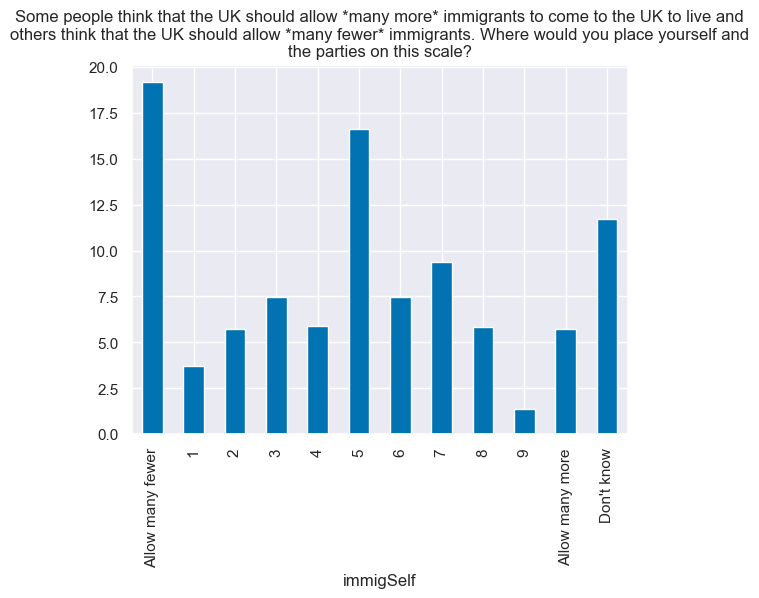

In [266]:
weighted_value_counts(df["immigSelf"], df["wt"],normalize=True,perc=True).sort_index()["weighted_sample_percentage"].plot(kind='bar');
plt.title("Some people think that the UK should allow *many more* immigrants to come to the UK to live and\n\
others think that the UK should allow *many fewer* immigrants. Where would you place yourself and\n\
the parties on this scale?");

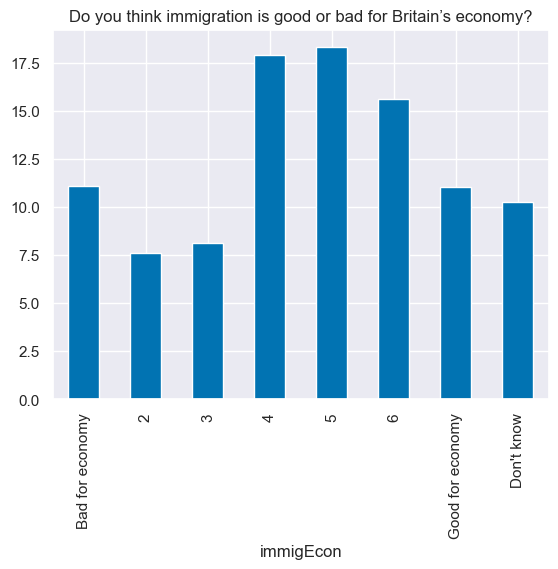

In [272]:
weighted_value_counts(df["immigEcon"], df["wt"],normalize=True,perc=True).sort_index()["weighted_sample_percentage"].plot(kind='bar');
plt.title("Do you think immigration is good or bad for Britain’s economy?");

In [276]:
weighted_value_counts(df["immigEcon"], df["wt"],normalize=True,perc=True).sort_index()["weighted_sample_percentage"][0:3].cumsum()

immigEcon
Bad for economy    11.08
2                  18.70
3                  26.84
Name: weighted_sample_percentage, dtype: float64

In [277]:
weighted_value_counts(df["immigEcon"], df["wt"],normalize=True,perc=True).sort_index()["weighted_sample_percentage"][4:7].cumsum()

immigEcon
5                   18.30
6                   33.92
Good for economy    44.96
Name: weighted_sample_percentage, dtype: float64